### The Three Regimes

- Evenly spaced, like what I've been doing
- Gappy/werewolf/some nights on and some nights off (like when observing gets cut short because of admin reasons)
- Dropout/missing data (like when there's bad weather): this can be applied to Regime 1 and Regime 2, so really there are four regimes

- Fourth regime, per Rae: Sometimes high cadence (eg. once per night) and sometimes low cadence (eg. once per three nights). Frame it as injection of a high cadence window in the sharp part of the RV curve for high eccentricity planets to get a better constraint on eccentricity.

In [1]:
import numpy as np 
import scipy
print(np.__version__)
print(scipy.__version__)
import tqdm
import pandas as pd
import random
import astropy 
from numpy.linalg import inv, det, solve, cond
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib

import jax
import jax.numpy as jnp
from jax import grad, jit, vmap
#from jax import random

1.23.4
1.9.3


In [16]:
path = '/Users/chris/Desktop/gaspery/'

In [2]:
def model(t, theta): 
    """
    Radial velocity model, given timestamps and planetary orbital parameters
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]

    """
    
    K, P, T0 = theta[0], theta[1], theta[2]
    arg = (2*np.pi/P)*(t-T0)
    rv = -K * np.sin(arg)
    
    return rv

def partial_mu(t, theta, wrt):
    """
    Unpack parameters and calculate all partial derivatives of the model w.r.t. those parameters
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    - wrt: parameter with respect to which the model's partial derivative is taken
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - derivative vector of length N
    """

    # unpack parameters
    K, P, T0 = theta[0], theta[1], theta[2]
    
    # calculate partial derivative depending on 'wrt'
    normalized_t = t-T0
    arg = (2*np.pi/P) * normalized_t
    
    if wrt=='K':
        return -np.sin(arg)
    elif wrt=='P':
        return K * np.cos(arg) * arg/P
    elif wrt=='T0':
        return (2*np.pi*K/P) * np.cos(arg)
    
    print("parameter not recognized")
    
    return                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

def calculate_fim(t, sigma, theta):
    """
    Calculate the generalized Fisher Information Matrix according to I_m,n in 
    https://en.wikipedia.org/wiki/Fisher_information#Multivariate_normal_distribution
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """

    #print("partial mu, partial K: ", partial_mu(t, theta, 'K'))
    #print("partial mu, partial P: ", partial_mu(t, theta, 'P'))
    #print("partial mu, partial T0: ", partial_mu(t, theta, 'T0'))
    factor2 = 1/sigma**2
    factor2[factor2 == np.inf] = 0 
    
    fim = np.zeros((len(theta),len(theta)))
    
    for i in range(len(theta)):
        for j in range(len(theta)):
            #param_i = theta[i]
            #param_j = theta[j]
            wrt_i = param_list[i]
            wrt_j = param_list[j]
            
            factor1 = partial_mu(t, theta, wrt_i)#.reshape((1,4)) # partial derivative of the model wrt row parameter, transposed
            #print(factor1)
            ###factor2 = 1/sigma**2 # inverse of covariance matrix (or just the RV variance if held constant)
            ###factor2[factor2 == np.inf] = 0 # turn infs into zeros (shouldn't it be nans?)
            #print(factor2)
            factor3 = partial_mu(t, theta, wrt_j)#.reshape((4,1)) # partial derivative of the model wrt column parameter
            #print(factor3)
            #print("shapes: ", factor1.shape, factor2.shape, factor3.shape)
            #print(np.dot(np.dot(factor1, factor2), factor3))
            
            fim[i][j] = np.dot(np.dot(factor1, factor2), factor3)
    
    return fim

def calculate_fim_faster(t, sigma, theta):
    """
    Calculate the generalized Fisher Information Matrix by calculating partial derivatives only once
    and then plugging them into the right places. 
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """
    
    factor2 = 1/sigma**2
    factor2[factor2 == np.inf] = 0 
    
    partial_k = partial_mu(t, theta, 'K')
    partial_p = partial_mu(t, theta, 'P')
    partial_t = partial_mu(t, theta, 'T0')
    
    fim = np.zeros((len(theta),len(theta)))
    
    for i in range(len(theta)):
        wrt_i = param_list[i]
        if wrt_i=='K':
            factor1 = partial_k
        elif wrt_i=='P':
            factor1 = partial_p
        elif wrt_i=='T0':
            factor1 = partial_t
        
        for j in range(len(theta)):
            wrt_j = param_list[j]
            if wrt_j=='K':
                factor3 = partial_k
            elif wrt_j=='P':
                factor3 = partial_p
            elif wrt_j=='T0':
                factor3 = partial_t
                            
            fim[i][j] = np.dot(np.dot(factor1, factor2), factor3)
    
    return fim

def calculate_fim_array(t, sigma, theta):
    """
    Calculate the generalized Fisher Information Matrix using np.stack instead of nested for loop
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """
    
    factor2 = 1/sigma**2
    factor2[factor2 == np.inf] = 0 
    
    partial_k = partial_mu(t, theta, 'K')
    partial_p = partial_mu(t, theta, 'P')
    partial_t = partial_mu(t, theta, 'T0')
    
    #print(np.dot(np.dot(partial_k, factor2), partial_k))
    #print(np.array([np.dot(np.dot(partial_k, factor2), partial_k), np.dot(np.dot(partial_k, factor2), partial_p), np.dot(np.dot(partial_k, factor2), partial_t)]))
    
    fim = np.stack([np.array([np.dot(np.dot(partial_k, factor2), partial_k), np.dot(np.dot(partial_k, factor2), partial_p), np.dot(np.dot(partial_k, factor2), partial_t)]),
                  np.array([np.dot(np.dot(partial_p, factor2), partial_k), np.dot(np.dot(partial_p, factor2), partial_p), np.dot(np.dot(partial_p, factor2), partial_t)]),
                  np.array([np.dot(np.dot(partial_t, factor2), partial_k), np.dot(np.dot(partial_t, factor2), partial_p), np.dot(np.dot(partial_t, factor2), partial_t)])])
    
    return fim

def model_jax(t, K, P, T0): 
    """
    Radial velocity model, given timestamps and planetary orbital parameters, but JAXified
    (basically, np --> jnp)
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]

    """
    
    #K, P, T0 = theta[0], theta[1], theta[2]
    #normalized_t = (t - T0 % P) % P # thanks, Rae! 
    #arg = (2*jnp.pi/P)*(normalized_t)
    
    arg = (2*jnp.pi/P)*(t-T0)
    rv = -K * jnp.sin(arg)
    
    return rv

def calculate_fim_jax(t, sigma, theta):
    """
    Calculate the generalized Fisher Information Matrix using JAX jacfwd to calculate partial derivatives
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """

    factor2 = 1/sigma**2
    factor2[factor2 == np.inf] = 0 
    
    jac = jax.jacfwd(model_jax, argnums=[1,2,3])
    partials = np.array(jac(test_t, float(test_K), float(test_P), float(test_T0)))
    partial_k = partials[0]
    partial_p = partials[1]
    partial_t = partials[2]
    
    fim = np.zeros((len(theta),len(theta)))
    
    for i in range(len(theta)):
        wrt_i = param_list[i]
        if wrt_i=='K':
            factor1 = partial_k
        elif wrt_i=='P':
            factor1 = partial_p
        elif wrt_i=='T0':
            factor1 = partial_t
        
        for j in range(len(theta)):
            wrt_j = param_list[j]
            if wrt_j=='K':
                factor3 = partial_k
            elif wrt_j=='P':
                factor3 = partial_p
            elif wrt_j=='T0':
                factor3 = partial_t
                            
            fim[i][j] = np.dot(np.dot(factor1, factor2), factor3)
    
    return fim

@jax.jit
def dfms_jax_version(t, sigma, theta): # thanks, Dan! 
    """
    Calculate the generalized Fisher Information Matrix using JAX Jacobian.
    Generalizable to arbitrary parameters.
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """
    
    def inner(params):
        return model_jax(t, params[0], params[1], params[2])
    
    factor = jnp.where(sigma > 0, 1/sigma**2, 0)    
    J = factor @ jax.jacobian(inner)(theta)
    
    return J.T @ J

In [3]:
start = 2300
n_obs = 2
cadence = 4
end = start + n_obs * cadence
np.linspace(2300, end, n_obs, endpoint=False)

array([2300., 2304.])

In [4]:
### free parameters from Langellier et al 2020
# let's hold these constant for now, but maybe we should sample from the given uncertainties later?
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude
sigma_wn_s = 0.178e-3 # white noise amplitude

def cov_matrix(t, params):
    """
    Build a covariance matrix, Sigma, that will be used in the calculation of the Fisher Information Matrix
    
    Inputs:
    - t: time series of length N observations; np.array [day]
    - Tau: active region lifetime [days]; free param taken from Langellier et al 2020
    - eta: smoothing parameter; free param taken from Langellier et al 2020
    - Prot: rotation period [days]; free param taken from Langellier et al 2020
    - sigma_qp_s: correlated noise amplitude; free param taken from Langellier et al 2020
    - sigma_wn_s: white noise amplitude; free param taken from Langellier et al 2020
    
    Outputs:
    - N by N matrix of covariance elements following Equations 1 & 2 of Langellier et al 2020
    
    """
    
    Tau, eta, Prot, sigma_qp_s, sigma_wn_s = params[0], params[1], params[2], params[3], params[4]
    
    # create N by N matrix, where N is length of observations time series
    k = np.zeros((len(t),len(t)))
    
    for i in range(len(t)):
        for j in range(len(t)):
            term1 = ((t[i]-t[j])**2)/(2*Tau**2)
            term2 = (1/(2*eta**2)) * (np.sin(np.pi * (t[i] - t[j])/Prot))**2
            arg = -term1 - term2
            k[i][j] = np.exp(arg)
    
    K = sigma_qp_s**2 * k + sigma_wn_s**2 * np.diag(np.ones(len(t)))
    
    return K

def cov_matrix_jax(t, params):
    """
    Build a covariance matrix, Sigma, that will be used in the calculation of the Fisher Information Matrix
    
    Inputs:
    - t: time series of length N observations; np.array [day]
    - Tau: active region lifetime [days]; free param taken from Langellier et al 2020
    - eta: smoothing parameter; free param taken from Langellier et al 2020
    - Prot: rotation period [days]; free param taken from Langellier et al 2020
    - sigma_qp_s: correlated noise amplitude; free param taken from Langellier et al 2020
    - sigma_wn_s: white noise amplitude; free param taken from Langellier et al 2020
    
    Outputs:
    - N by N matrix of covariance elements following Equations 1 & 2 of Langellier et al 2020
    
    """
    
    Tau, eta, Prot, sigma_qp_s, sigma_wn_s = params[0], params[1], params[2], params[3], params[4]
    
    # create N by N matrix, where N is length of observations time series
    k = jnp.zeros((len(t),len(t)))
    
    for i in range(len(t)):
        for j in range(len(t)):
            term1 = ((t[i]-t[j])**2)/(2*Tau**2)
            term2 = (1/(2*eta**2)) * (jnp.sin(jnp.pi * (t[i] - t[j])/Prot))**2
            arg = -term1 - term2
            #k[i][j] = jnp.exp(arg)
            k = jnp.exp(arg)
            #k = k.at[i]
            #x = x.at[idx].set(y)
    
    K = sigma_qp_s**2 * k + sigma_wn_s**2 * jnp.diag(np.ones(len(t)))
    #print("shape: ", K.shape)
    
    return K

params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

In [5]:
### priors
param_list = ['K','P','T0']
test_T0 = 2360 # BJD
test_K = 500 # 5 m/s to 500 cm/s; it worked for 10000 cm/s
test_P = 8.3 #10 # days
start = 2352

test_theta = [test_K, test_P, test_T0]

def make_t(n_obs, cadence, start):
    """
    Gemerate observation times given a number of observations and an average cadence (every X nights)
    
    Input: 
    - n_obs: number of observations to try
    - cadence: amount of time between observations [days]
    - start: start time [BJD]
    
    Output:
    - observation times: ndarray
    
    """
    
    ### make a t using n_obs and cadence
    # initial obs time of 2300 is a placeholder that's set as somewhat close to the arbitrary test_T0 of 2360
    end = start + n_obs * cadence 
    t = np.linspace(start, end, n_obs, endpoint=False)
    #print(start, end, n_obs, t)
    
    # add jitter ~ N(0, 1 hr) to timestamps
    t += np.random.normal(0, 1./24)

    return t

def make_t_without_jitter(n_obs, cadence, start):
    """
    Gemerate observation times given a number of observations and an average cadence (every X nights)
    
    Input: 
    - n_obs: number of observations to try
    - cadence: amount of time between observations [days]
    - start: start time [BJD]
    
    Output:
    - observation times: ndarray
    
    """
    
    ### make a t using n_obs and cadence
    # initial obs time of 2300 is a placeholder that's set as somewhat close to the arbitrary test_T0 of 2360
    end = start + n_obs * cadence 
    t = np.linspace(2300, end, n_obs, endpoint=False)
    
    return t

def strategy(start, n_obs, cadence, theta, sigma_val=None):
    """
    Allows user to try different n_obs and cadences and visualize how that affects the expected RV semi-amplitude uncertainty, sigma_K
    
    Input: 
    - start: start time from which I build out n_obs * cadence
    - n_obs: number of observations to try
    - cadence: amount of time between observations [days]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    - sigma_val: RV measurement uncertainties associated with each observation; float64 [cm/s]
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - sigma_ks: array of sigma_k's calculated by np.linalg.inv [cm/s]
    - sigma_ks_stable: array of sigma_k's calculated by 1/np.sqrt(FIM[0][0])
    
    """
    
    ### make a t using n_obs and cadence
    # initial obs time of 2300 is a placeholder that's set as somewhat close to the arbitrary test_T0 of 2360
    t = make_t(n_obs, cadence, start)
    #print("time steps: ", t)bb
    
    ### make covariance matrix in the scalar, white noise case
    if sigma_val != None:
        sigma_val += 1e-6 # perturb sigma_val to guard against numerical instabilities
        sigma = np.diag(np.ones(len(t))) * sigma_val**2 # covariance matrix of scalar sigma_RV's
        sigma = np.linalg.solve(sigma, np.identity(len(sigma))) # invert to make factor2 for FIM
        
        fim = calculate_fim(t, sigma, theta)
        #print("FIM: ", fim)
        #print("det: ", det(fim))
        inv_fim = inv(fim)
        #print("inv: ", inv_fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        #print("sigma_K, using inv: ", sigma_k)
        #sigma_ks.append(sigma_k)
        sigma_k_stable = np.sqrt(1/fim[0][0])
        #print("sigma_K, not using inv: ", sigma_k_stable)

        # np.linalg.solve is more stable than np.linalg.inv, apparently
        inv_fim_solve = solve(fim, np.diag(np.ones(len(theta)))) 
        sigma_k_solve = np.sqrt(inv_fim_solve)[0][0]
        
        return sigma_k, sigma_k_stable, sigma_k_solve, fim
    
    ### make covariance matrix in the correlated noise case
    else:
        sigma = cov_matrix(t, params)
        sigma += 1e-6 
        sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM
        
        fim = calculate_fim(t, sigma, theta)
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        sigma_k_stable = np.sqrt(1/fim[0][0])
        inv_fim_solve = solve(fim, np.diag(np.ones(len(theta)))) 
        sigma_k_solve = np.sqrt(inv_fim_solve)[0][0]
        
        return sigma_k, sigma_k_stable, sigma_k_solve, fim

@jax.jit
def dfms_jax_version(t, sigma, theta): # thanks, Dan! 
    def inner(model_params):
        return model_jax(t, model_params[0], model_params[1], model_params[2])
    
    sigma += 1e-6 # add jitter
    factor = jnp.linalg.solve(sigma, jnp.identity(len(sigma))) # take inverse of covariance matrix
    #factor = jnp.linalg.inv(sigma)
    #factor = jnp.where(sigma > 0, sigma_inv, 0)  
    
    J = jax.jacobian(inner)(theta)
    
    return J.T @ factor @ J

@jax.jit
def jax_fim(t, sigma, theta, stellar_params): 
    """
    Calculate the generalized Fisher Information Matrix using JAX Jacobian.
    Generalizable to arbitrary parameters.
    Now, with second term for correlated noise. 
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    - stellar_params: correlated stellar noise parameters, a la Langellier et al 2021; np.array
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    stellar_params breakdown: 
    - Tau: active region lifetime [days]
    - eta: smoothing parameter
    - Prot: rotation period [days]
    - sigma_qp_s: correlated noise amplitude
    - sigma_wn_s: white noise amplitude
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """
    
    def inner(params):
        return model_jax(t, params[0], params[1], params[2])
    
    def inner_sigma(t, params):
        return cov_matrix_jax(t, params)
    
    sigma += 1e-6 # add jitter
    factor = jnp.linalg.solve(sigma, jnp.identity(len(sigma))) # take inverse of covariance matrix
    #factor = jnp.linalg.inv(sigma)
    #factor = jnp.where(sigma > 0, sigma_inv, 0)  
    
    J = jax.jacobian(inner)(theta)
    first_term = J.T @ factor @ J
    
    S = jax.jacobian(inner_sigma)(t, stellar_params)
    print("factor: ", factor, factor.shape) # 30 x 30
    print("S: ", S, S.shape) # 30 x 30 x 30
          
    trace_of = factor @ S @ factor @ S
    print("trace of: ", trace_of, trace_of.shape)
    
    second_term = 0.5 * jnp.trace(trace_of)
    print(first_term, first_term.shape)
    print(second_term, second_term.shape)
    
    return first_term + second_term

def strategy_jax(start, n_obs, cadence, theta, sigma_val=None):
    """
    Allows user to try different n_obs and cadences and visualize how that affects the expected RV semi-amplitude uncertainty, sigma_K
    
    Input: 
    - start: start time from which I build out n_obs * cadence
    - n_obs: number of observations to try
    - cadence: amount of time between observations [days]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    - sigma_val: RV measurement uncertainties associated with each observation; float64 [cm/s]
    
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - sigma_ks: array of sigma_k's calculated by np.linalg.inv [cm/s]
    - sigma_ks_stable: array of sigma_k's calculated by 1/np.sqrt(FIM[0][0])
    
    """
    
    ### make a t using n_obs and cadence
    # initial obs time of 2300 is a placeholder that's set as somewhat close to the arbitrary test_T0 of 2360
    t = make_t(n_obs, cadence, start)
    #print("time steps: ", t)
    
    ### make covariance matrix in the scalar, white noise case
    if sigma_val != None:
        sigma_val += 1e-6 # perturb sigma_val to guard against numerical instabilities
        sigma = np.diag(np.ones(len(t))) * sigma_val**2 # covariance matrix of scalar sigma_RV's
        sigma = np.linalg.solve(sigma, np.identity(len(sigma))) # invert to make factor2 for FIM
        
        args = t, sigma, jnp.array(theta, dtype=float)
        fim = dfms_jax_version(*args).block_until_ready()
        
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        return fim[0][0], sigma_k
    
    ### make covariance matrix in the correlated noise case
    else:
        sigma = cov_matrix(t, params)
        sigma += 1e-6 
        sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM
        
        args = t, sigma, jnp.array(theta, dtype=float)
        fim = dfms_jax_version(*args).block_until_ready()
        
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        return fim[0][0], sigma_k

print(strategy(start=start, n_obs=100, cadence=1, theta=test_theta, sigma_val=30)) # default to 2300

(0.00015752201401285736, 0.0001574770887371119, 0.00015752201401285736, array([[4.03241522e+07, 1.28147385e+09, 4.48771411e+05],
       [1.28147385e+09, 2.16779571e+14, 2.91309752e+13],
       [4.48771411e+05, 2.91309752e+13, 5.82747326e+12]]))


/var/folders/fm/fpkllzw93kq7c5y3zl98167m0000gn/T/ipykernel_20990/2524423991.py:82: RuntimeWarning: divide by zero encountered in divide
  factor2 = 1/sigma**2
/var/folders/fm/fpkllzw93kq7c5y3zl98167m0000gn/T/ipykernel_20990/2027747029.py:94: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
/var/folders/fm/fpkllzw93kq7c5y3zl98167m0000gn/T/ipykernel_20990/2027747029.py:102: RuntimeWarning: invalid value encountered in sqrt
  sigma_k_solve = np.sqrt(inv_fim_solve)[0][0]


In [6]:
@jax.jit
def clam_jax_fim(t, sigma, theta): 
    """
    Calculate the generalized Fisher Information Matrix using JAX Jacobian.
    Generalizable to arbitrary parameters.
    Now, with second term for correlated noise. 
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    - stellar_params: correlated stellar noise parameters, a la Langellier et al 2021; np.array
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """
    
    def inner(params):
        return model_jax(t, params[0], params[1], params[2])
    
    sigma += 1e-6 # add jitter
    factor = jnp.linalg.solve(sigma, jnp.identity(len(sigma))) # take inverse of covariance matrix
    #factor = jnp.linalg.inv(sigma)
    #factor = jnp.where(sigma > 0, sigma_inv, 0)  
    
    J = jax.jacobian(inner)(theta)
    return J.T @ factor @ J
    

### Regime B: Werewolf Regime

aka gappy aka some nights on/some nights off

I want to be able to specify how many nights in a row to observe and how many nights in a row to skip, eg. input: {nights on, cadence, percentage of completed observations}

In [7]:
def remove(l,n):
    return np.sort(random.sample(list(l),int(len(l)*(1-n))))

def gappy(n_obs, cadence, start, offs=[], dropout=0.):
    """
    Specify how many nights in a row to observe and how many nights in a row to skip,
    eg. input: {nights on, cadence, percentage of completed observations} 
    
    Input: 
    - n_obs: number of observations to make; this is a fixed goal [int]
    - cadence: amount of time between observations [days]
    - start: start time [BJD]
    - offs: all pairs of off-night spans, described by their start/end times [list of two-element lists of floats]
    - dropout: percent of dropout due to weather and other uniformly distributed unfortunate events
    
    Output:
    - observation times: ndarray of floats
    
    """
    
    total_t = []
    start_temp = start
    n_tot = 0
    n = 0
    
    if len(offs) > 0:
        # keep making observations until you've reached your prescribed budget of observations
        while n_tot < n_obs:
            # allow for multiple spans of off nights
            for off in offs:

                end_temp = off[0]

                # rearrange from end = start + n_obs * cadence to get on chunk
                n = int(np.ceil((end_temp - start_temp)/cadence))
                #print(" start: ", start_temp, "end: ", end_temp, "n_obs: ", n)

                try: # if off != offs[-1]: # if there are yet more offs? 
                    t = np.linspace(start_temp, end_temp, n, endpoint=False)
                    # add jitter ~ N(0, 1 hr) to timestamps
                    t += np.random.normal(0, 1./24)
                    total_t = np.concatenate([total_t, t])
                    n_remaining = n_obs - len(total_t)

                except: # if there aren't, then we just straight shot til n_obs is fulfilled
                    #n_remaining = n_obs - len(total_t)
                    #print("exception")
                    end_temp = start_temp + n_remaining * cadence
                    #print(start_temp, end_temp, n_remaining)
                    t = np.linspace(start_temp, end_temp, n_remaining, endpoint=False)

                    # add jitter ~ N(0, 1 hr) to timestamps
                    t += np.random.normal(0, 1./24)

                    #total_t.append(t)
                    total_t = np.concatenate([total_t, t])

                #print(t)

                # new start time
                start_temp = off[1]

                n_tot = len(total_t)
                #print("N total: ", n_tot)

                if n_tot >= n_obs:
                    break

            # let's say there's no more offs and yet more observations to make
            # Then, we just straight shot til n_obs is fulfilled          

        # pare down total_t if the last concatenation overshoots n_obs
        # I have logic for dealing with that if I get through all off nights
        # But n_obs gets hit before then, this is to take care of that.
        n_extra = n_tot - n_obs
        #print("n extra: ", n_extra)
        if n_extra > 0:
            total_t = total_t[:-n_extra]
    
    else:
        total_t = make_t(n_obs, cadence, start)
        #print("total: ", total_t)
    
    # dropout some observations based on dropout
    total_t = remove(total_t, dropout)
    
    return total_t

In [8]:
test_T0 = 2360 # BJD
test_K = 500 # 5 m/s to 500 cm/s; it worked for 10000 cm/s
test_P = 8.3 #10 # days
test_theta = [test_K, test_P, test_T0]

n_obs = 30 # 9
cadence = 2
start = 2300
dropout = 0.1
offs = [[2310, 2317], [2327, 2340], [2350, 2360]]
offs = [[2314, 2328], [2342, 2356]]
strat = gappy(n_obs = n_obs, cadence = cadence, start = start, offs = offs, dropout = dropout)
strat = gappy(n_obs = n_obs, cadence = cadence, start = start)



### Visualize to verify

FIM:  [[ 1.7880541e+08 -4.9634808e+10 -6.7977082e+08]
 [-4.9634046e+10  4.9125789e+14 -1.0312650e+14]
 [-6.8013658e+08 -1.0312626e+14  2.7707650e+13]]
sigma_k using linalg.inv:  8.072448e-05


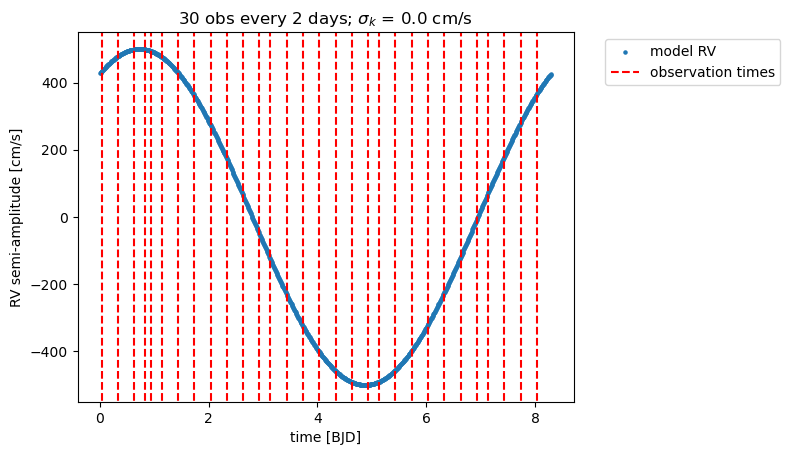

In [9]:
sigma = cov_matrix(strat, params)
sigma += 1e-6 
#sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
fim = clam_jax_fim(*args).block_until_ready()

inv_fim = inv(fim)
sigma_k = np.sqrt(inv_fim)[0][0]
        
#sigma_k, sigma_k_stable, sigma_k_solve, fim = strategy(start=start, n_obs=n_obs, cadence=cadence, theta=test_theta)
print("FIM: ", fim)
print("sigma_k using linalg.inv: ", sigma_k)
#print("sigma_k using linalg.solve: ", sigma_k_solve)
#print("sigma_k using 1/sqrt(FIM_ii): ", sigma_k_stable)
      
### RV model
start = 2300 # BJD
end = 2400 # BJD
test_t = np.linspace(start, end, 1000) + np.random.normal(0, 1./24)
test_t_phase_folded = test_t % test_P
#sigma_val = 30+1e-6 # cm/s
#test_sigma = np.ones(len(test_t))*sigma_val
y = model(test_t, test_theta)
y_phase_folded = model(test_t_phase_folded, test_theta)

### plot observations from strategy
#end = start + cadence * n_obs
#strat = np.linspace(start, end, n_obs) + np.random.normal(0, 1./24)
strat_phase_folded = np.array(strat) % test_P

plt.scatter(test_t_phase_folded, y_phase_folded, s=5, label='model RV')
plt.axvline(0, 0, 0, linestyle='--', c='r', label='observation times')
for i in strat_phase_folded:
    plt.axvline(i, min(y_phase_folded), max(y_phase_folded), linestyle='--', c='r')
plt.xlabel('time [BJD]')
plt.ylabel('RV semi-amplitude [cm/s]')
plt.title(f'{n_obs} obs every {cadence} days; ' + r'${\sigma}_k$' + f' = {np.round(sigma_k, 1)} cm/s')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
#plt.savefig('plots/strategy4.pdf', format='pdf')
plt.show()

### Explore Evenly Spaced Regime While Varying All the Hyperparameters 

planet hyperparams: {period and cadence}

stellar hyperparameters: {Prot, Tau, eta, sigma_qp_s/sigma_wn_s}

In [10]:
@jax.jit
def jax_fim_first(t, sigma, theta, stellar_params): 
    """
    Calculate the generalized Fisher Information Matrix using JAX Jacobian.
    Generalizable to arbitrary parameters.
    Now, with second term for correlated noise. 
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    - stellar_params: correlated stellar noise parameters, a la Langellier et al 2021; np.array
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    stellar_params breakdown: 
    - Tau: active region lifetime [days]
    - eta: smoothing parameter
    - Prot: rotation period [days]
    - sigma_qp_s: correlated noise amplitude
    - sigma_wn_s: white noise amplitude
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """
    
    def inner(params):
        return model_jax(t, params[0], params[1], params[2])
    
    def inner_sigma(t, params):
        return cov_matrix_jax(t, params)
    
    sigma += 1e-6 # add jitter
    factor = jnp.linalg.solve(sigma, jnp.identity(len(sigma))) # take inverse of covariance matrix
    #factor = jnp.linalg.inv(sigma)
    #factor = jnp.where(sigma > 0, sigma_inv, 0)  
    
    J = jax.jacobian(inner)(theta)
    first_term = J.T @ factor @ J
    
    return first_term


@jax.jit
def jax_fim_second(t, sigma, theta, stellar_params): 
    """
    Calculate the generalized Fisher Information Matrix using JAX Jacobian.
    Generalizable to arbitrary parameters.
    Now, with second term for correlated noise. 
    
    Inputs: 
    - t: time series of length N observations; np.array [day]
    - sigma: RV measurement uncertainties associated with each observation; np.array of length N [cm/s]
    - theta: planet orbital parameters; eg. [K, P, T0]; np.array
    - stellar_params: correlated stellar noise parameters, a la Langellier et al 2021; np.array
    theta breakdown:
    - K: RV semi-amplitude [cm/s]
    - P: planet period [days]
    - T0: mean transit time [day]
    stellar_params breakdown: 
    - Tau: active region lifetime [days]
    - eta: smoothing parameter
    - Prot: rotation period [days]
    - sigma_qp_s: correlated noise amplitude
    - sigma_wn_s: white noise amplitude
    
    Output:
    - Fisher Information Matrix: len(theta)xlen(theta) matrix; np.array
    
    """
    
    def inner(params):
        return model_jax(t, params[0], params[1], params[2])
    
    def inner_sigma(t, params):
        return cov_matrix_jax(t, params)
    
    sigma += 1e-6 # add jitter
    factor = jnp.linalg.solve(sigma, jnp.identity(len(sigma))) # take inverse of covariance matrix
    
    S = jax.jacobian(inner_sigma)(t, stellar_params)
    #print("factor: ", factor, factor.shape) # 30 x 30
    #print("S: ", S, S.shape) # 30 x 30 x 30
          
    trace_of = factor @ S @ factor @ S
    #print("trace of: ", trace_of, trace_of.shape)
    
    second_term = 0.5 * jnp.trace(trace_of)
    
    return factor, S, trace_of, second_term

#### Different Taus and sigma_qp_s/sigma_wn_s

In [11]:
test_T0 = 2360
n_obs = 30
start = 2350
strat = gappy(n_obs = n_obs, cadence = cadence, start = start)
print(strat)

[2349.92896112 2351.92896112 2353.92896112 2355.92896112 2357.92896112
 2359.92896112 2361.92896112 2363.92896112 2365.92896112 2367.92896112
 2369.92896112 2371.92896112 2373.92896112 2375.92896112 2377.92896112
 2379.92896112 2381.92896112 2383.92896112 2385.92896112 2387.92896112
 2389.92896112 2391.92896112 2393.92896112 2395.92896112 2397.92896112
 2399.92896112 2401.92896112 2403.92896112 2405.92896112 2407.92896112]


In [12]:
# stellar correlated noise parameters
prots = np.linspace(1, 32, 200) 
taus = np.linspace(5, 100, 200)
etas = np.linspace(0.1, 0.9, 200)
sigma_qp_ss = np.logspace(-5, 0, 200)
#sigma_wn_ss = np.logspace(-4, -1, 30)
#sigma_qp_wn_ratios = sigma_qp_ss/sigma_wn_ss

# planet observation parameters
periods = np.linspace(1, 30, 200)
cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

# static planet observation parameters
period = test_P
cadence = 1

In [401]:
sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(taus)*len(sigma_qp_ss)).reshape((len(taus),len(sigma_qp_ss)))
#sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
#sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(taus)*len(sigma_qp_ss)).reshape((len(taus),len(sigma_qp_ss)))

for enum1, tau in enumerate(tqdm(taus)):
    for enum2, sigma_qp_s in enumerate(sigma_qp_ss):
        
        params = [tau, eta, Prot, sigma_qp_s, sigma_wn_s] # tau, sigma_qp_s
        test_theta = [test_K, period, test_T0]
        
        #sigma_k, sigma_k_stable, sigma_k_solve, fim = strategy(start=start, n_obs=n_obs, cadence=cadence, theta=test_theta)
        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = dfms_jax_version(*args).block_until_ready()
        #args = np.array(strat), sigma, jnp.array(test_theta, dtype=float), jnp.array(params, dtype=float)
        #fim = jax_fim(*args).block_until_ready()
        
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        ###inv_fim = inv(fim)
        ###sigma_k = np.sqrt(inv_fim)[0][0]
        ###sigma_k_stable = np.sqrt(1/fim[0][0])
        ###inv_fim_solve = solve(fim, np.diag(np.ones(len(test_theta)))) 
        ###sigma_k_solve = np.sqrt(inv_fim_solve)[0][0]
        
        # for 1D plots and testing
        #sigma_k_test.append(sigma_k)
        #sigma_k_solve_test.append(sigma_k_solve)
        #sigma_k_stable_test.append(sigma_k_stable)

        #fi_k_test.append(fi_k)
        
        # for 2D plots and testing
        sigma_ks[enum1][enum2] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum1][enum2] = fi_k
        

  0%|                                                                                                                                               | 0/200 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/701518446.py:28: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [03:16<00:00,  1.02it/s]


/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/239838032.py:3: RuntimeWarning: invalid value encountered in sqrt
  plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm()) # vmin=1e5, vmax=1e10


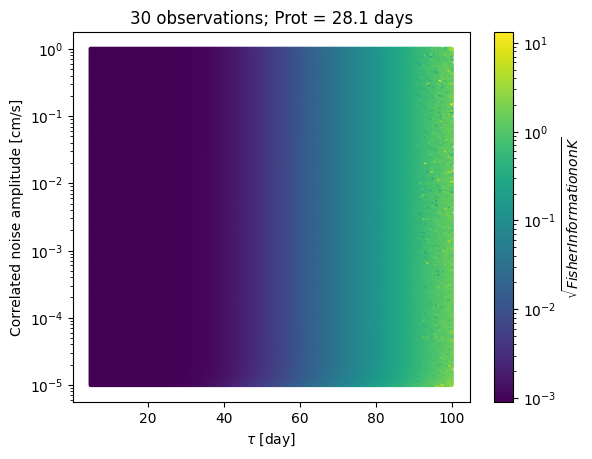

In [358]:
x, y = np.meshgrid(taus, sigma_qp_ss)
#plt.scatter(x, y, c=np.sqrt(fi_ks), norm=matplotlib.colors.LogNorm(vmin=1e0, vmax=1e4)) # vmin=1e5, vmax=1e10
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm()) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel(r"$\tau$ [day]")
plt.ylabel("Correlated noise amplitude [cm/s]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days")
#plt.savefig("plots/cadence_v_period_sqrt_fi_500_prot8.pdf", format="pdf")
plt.show()

#### Etas vs Correlated Noise Amplitude

In [359]:
sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(etas)*len(sigma_qp_ss)).reshape((len(etas),len(sigma_qp_ss)))
fi_ks = np.ones(len(etas)*len(sigma_qp_ss)).reshape((len(etas),len(sigma_qp_ss)))

for enum1, eta in enumerate(tqdm(etas)):
    for enum2, sigma_qp_s in enumerate(sigma_qp_ss):
        
        params = [tau, eta, Prot, sigma_qp_s, sigma_wn_s] # tau, sigma_qp_s
        test_theta = [test_K, period, test_T0]
        
        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = dfms_jax_version(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum1][enum2] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum1][enum2] = fi_k


  0%|                                                                                                                                               | 0/200 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2973858941.py:22: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [03:48<00:00,  1.14s/it]


/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/3131217775.py:3: RuntimeWarning: invalid value encountered in sqrt
  plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm()) # vmin=1e5, vmax=1e10


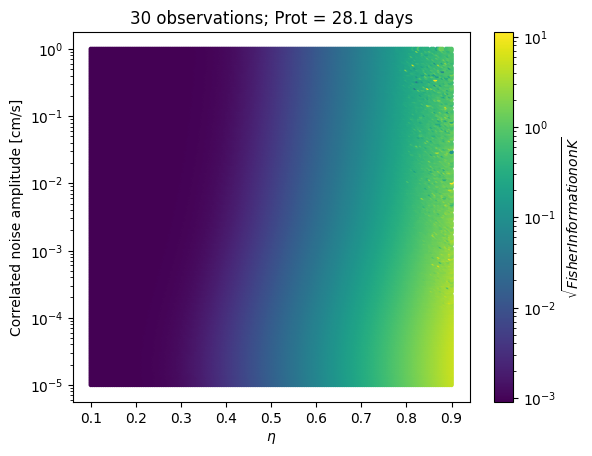

In [360]:
x, y = np.meshgrid(etas, sigma_qp_ss)
#plt.scatter(x, y, c=np.sqrt(fi_ks), norm=matplotlib.colors.LogNorm(vmin=1e0, vmax=1e4)) # vmin=1e5, vmax=1e10
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm()) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel(r"$\eta$")
plt.ylabel("Correlated noise amplitude [cm/s]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days")
#plt.savefig("plots/cadence_v_period_sqrt_fi_500_prot8.pdf", format="pdf")
plt.show()

#### Prot vs Tau

In [363]:
sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(prots)*len(etas)).reshape((len(prots),len(etas)))
fi_ks = np.ones(len(prots)*len(etas)).reshape((len(prots),len(etas)))

for enum1, prot in enumerate(tqdm(prots)):
    for enum2, eta in enumerate(etas):
        
        params = [tau, eta, Prot, sigma_qp_s, sigma_wn_s] # tau, sigma_qp_s
        test_theta = [test_K, period, test_T0]
        
        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = dfms_jax_version(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum1][enum2] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum1][enum2] = fi_k



  0%|                                                                                                                                               | 0/200 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2340638522.py:22: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [03:50<00:00,  1.15s/it]


/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2170261782.py:3: RuntimeWarning: invalid value encountered in sqrt
  plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm()) # vmin=1e5, vmax=1e10


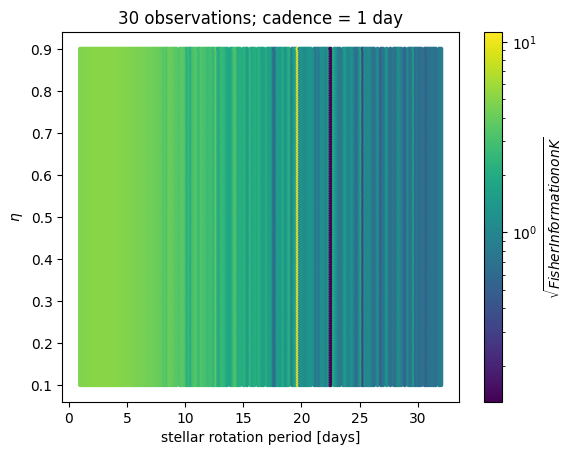

In [365]:
x, y = np.meshgrid(prots, etas)
#plt.scatter(x, y, c=np.sqrt(fi_ks), norm=matplotlib.colors.LogNorm(vmin=1e0, vmax=1e4)) # vmin=1e5, vmax=1e10
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm()) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel(r"stellar rotation period [days]")
#plt.ylabel(r"$\tau$ [day]")
plt.ylabel(r"$\eta$")
plt.title(f"{n_obs} observations; cadence = {cadence} day")
#plt.savefig("plots/cadence_v_period_sqrt_fi_500_prot8.pdf", format="pdf")
plt.show()

#### Cadence vs planet orbital period (ie. the observing/planet parameters), while varying Prot, as well as start

In [794]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
#periods = np.linspace(1, 100, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        #fim = dfms_jax_version(*args).block_until_ready()
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2626855429.py:48: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:45<00:00,  2.22it/s]


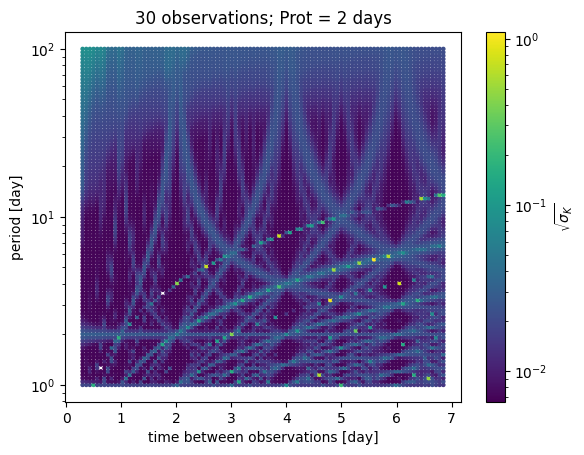

In [795]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(sigma_ks), s=5, norm=matplotlib.colors.LogNorm()) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{\sigma_K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
#plt.ylim([0, 100])
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days")
plt.show()

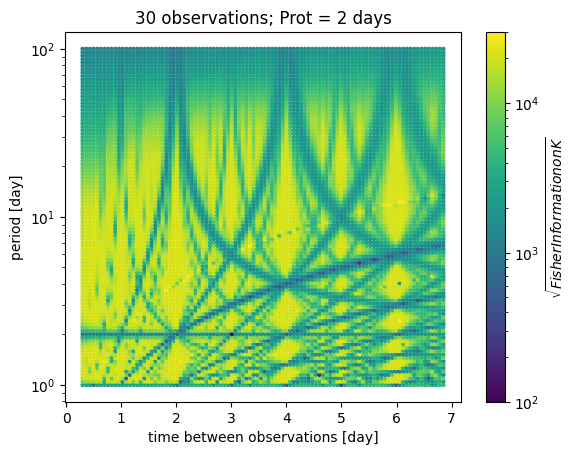

In [796]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
#plt.ylim([0, 100])
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days")
plt.savefig("plots/prot/fim_prot2.pdf", format="pdf")
plt.show()

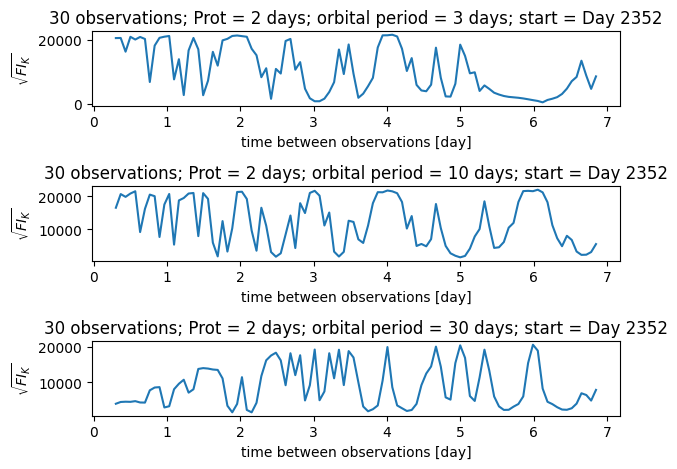

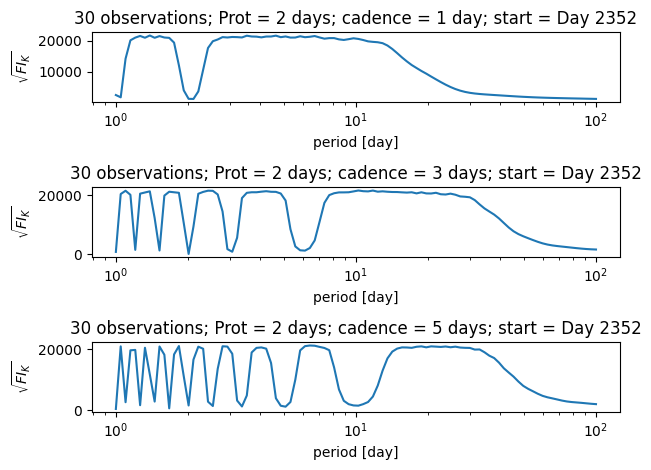

In [797]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day 2352")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day 2352")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day 2352")

plt.tight_layout()
plt.savefig("plots/prot/fim_prot2_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day 2352")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day 2352")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day 2352")

plt.tight_layout()
plt.savefig("plots/prot/fim_prot2_cadences.pdf", format="pdf")
plt.show()

In [48]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 8 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 100 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_1290/4072324724.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [08:33<00:00,  5.13s/it]


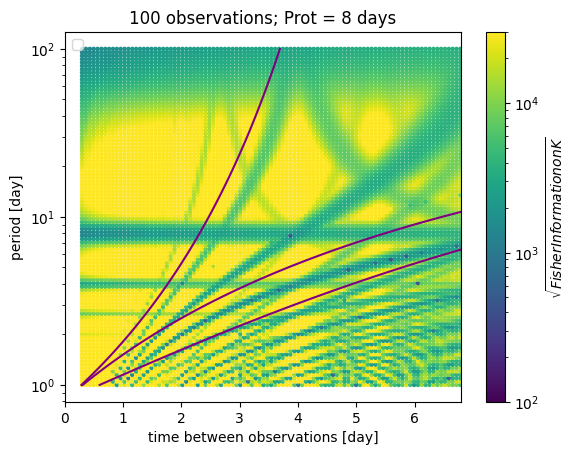

In [55]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10

"""
plt.plot(t3s_plus_half, periods, color='black', label='1/2 beat frequency', alpha=0.5) 
plt.plot(np.abs(t3s_minus_half), periods, color='black', alpha=0.5) 
plt.plot(t3s_plus_third, periods, color='red', label='1/3 beat frequency', alpha=0.5) 
plt.plot(np.abs(t3s_minus_third), periods, color='red', alpha=0.5) 
plt.plot(t3s_plus_two_third, periods, color='orange', label='2/3 beat frequency', alpha=0.5) 
plt.plot(np.abs(t3s_minus_two_third), periods, color='orange', alpha=0.5) 
"""

plt.plot(t1s_plus, periods, color='purple')
plt.plot(np.abs(t1s_minus), periods, color='purple')
plt.plot(t1s_plus + np.abs(t1s_minus), periods, color='purple')

cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{FI_K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.xlim([0,6.8])
plt.title(f"{n_obs} observations; Prot = {Prot} days")
plt.legend()
#plt.savefig("plots/prot/fim_prot8_100obs_beats.png", format="png")
plt.show()

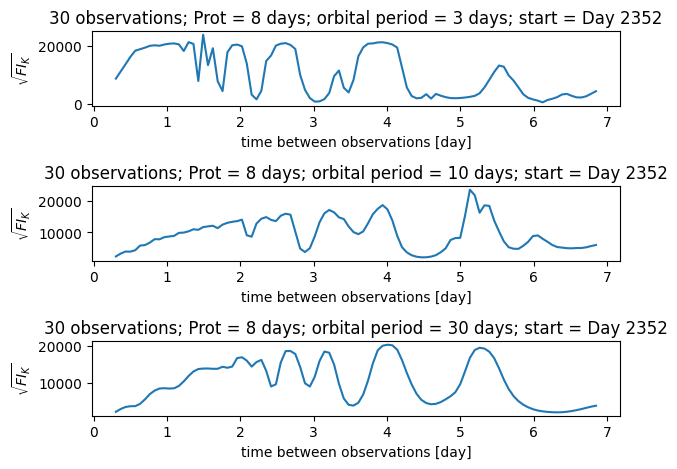

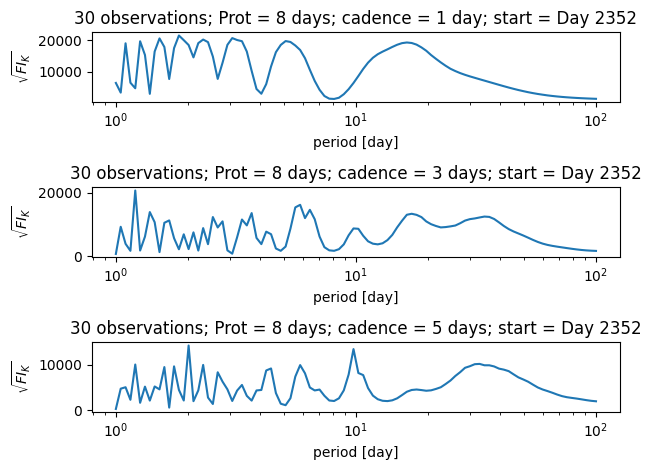

In [800]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig("plots/prot/fim_prot8_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig("plots/prot/fim_prot8_cadences.pdf", format="pdf")
plt.show()

#### Beat Frequencies

In [45]:
Prot2 = Prot * (2./3)
Prot1 = Prot * (1./3)
Prot_half = Prot * (1./2)

t3s_plus_half = []
t3s_minus_half = []
t3s_plus_third = []
t3s_minus_third = []
t3s_plus_two_third = []
t3s_minus_two_third = []
t1s_plus = []
t1s_minus = []

for i in tqdm(range(100)):
    p = periods[i]
    c = cadences[i]
    
    t3_plus_half = 1/((1/p) + (1/Prot_half))
    t3_minus_half = 1/((1/p) - (1/Prot_half))
    t3s_plus_half.append(t3_plus_half)
    t3s_minus_half.append(t3_minus_half)
    
    t3_plus_third = 1/((1/p) + (1/Prot1))
    t3_minus_third = 1/((1/p) - (1/Prot1))
    t3s_plus_third.append(t3_plus_third)
    t3s_minus_third.append(t3_minus_third)
    
    t3_plus_two_third = 1/((1/p) + (1/Prot2))
    t3_minus_two_third = 1/((1/p) - (1/Prot2))
    t3s_plus_two_third.append(t3_plus_two_third)
    t3s_minus_two_third.append(t3_minus_two_third)
    
    t1_plus = 1/((1/c) + (1/Prot))
    t1_minus = 1/((1/c) - (1/Prot))
    t1s_plus.append(t1_plus)
    t1s_minus.append(t1_minus)

    

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 49113.63it/s]


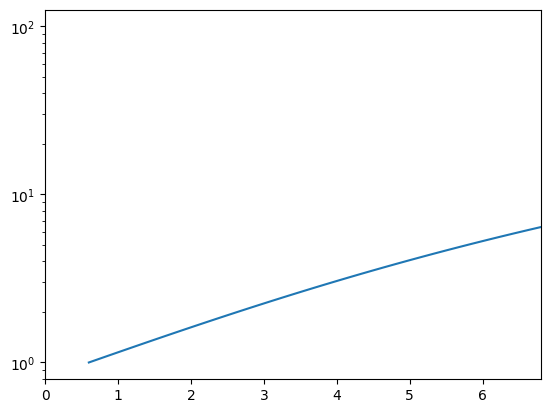

In [49]:
#plt.plot(t1s_plus, periods) 
#plt.plot(np.abs(t1s_minus), periods) 
plt.plot(t1s_plus + np.abs(t1s_minus), periods)
#plt.plot(cadences, t1s_plus)
plt.xlim([0,6.8])
plt.yscale('log')
plt.show()

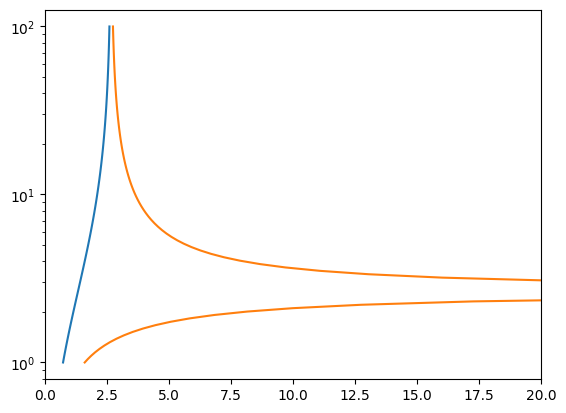

In [34]:
#plt.plot(t3s_plus)
#plt.plot(t3s_minus)
#plt.plot(t1s_plus)
#plt.plot(t1s_minus)

plt.plot(t3s_plus, periods) 
plt.plot(np.abs(t3s_minus), periods) 
#plt.plot(cadences, t1s_plus)
plt.xlim([0,20])
plt.yscale('log')
plt.show()

In [ ]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 8 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

In [801]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 28 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/620510802.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.12it/s]


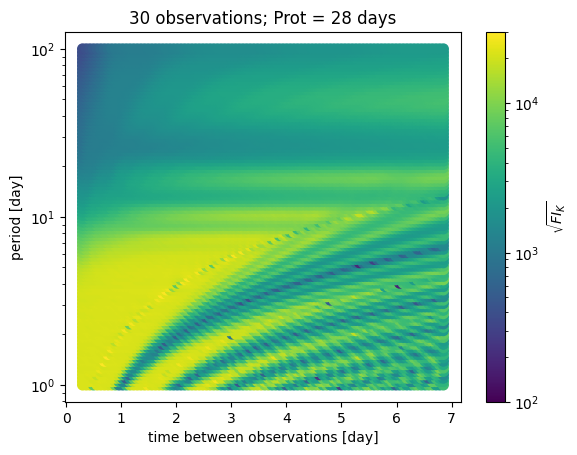

In [802]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=50, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{FI_K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days")
plt.savefig("plots/prot/fim_prot28.pdf", format="pdf")
plt.show()

#### Sideplot: do I need to transpose??

In [684]:
p = 4.64
c = 4.67 #2.48

test_theta = [test_K, p, test_T0]
strat = gappy(n_obs = n_obs, cadence = c, start = start)

sigma = cov_matrix(strat, params)
sigma += 1e-6 

args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
fim = clam_jax_fim(*args).block_until_ready()
fi_k = fim[0][0]
print(np.sqrt(fi_k))

647.5253


In [676]:
print(periods)
print(cadences)

[  1.           1.66810054   2.7825594    4.64158883   7.74263683
  12.91549665  21.5443469   35.93813664  59.94842503 100.        ]
[0.3        1.02777778 1.75555556 2.48333333 3.21111111 3.93888889
 4.66666667 5.39444444 6.12222222 6.85      ]


In [694]:
print(np.sqrt(fi_ks))
print(np.sqrt(fi_ks)[0][:])
print(np.sqrt(fi_ks).T[:][0])

[[21746.58042084  1297.40192308 16847.21935513 21703.22593533
   4326.85174232  3057.40478184  4365.76064392  4411.7459129
   4828.18413071  4997.50177589]
 [21419.78972819 21394.94295389  1612.6724714  15803.27054758
   2872.28410851 13408.40512514  2592.57458909  2723.13532532
   7099.64139939  4207.64827427]
 [20988.53477497 21093.45452978 21717.1563516   2046.34002551
   3448.44907168  9833.65445803  4438.92982598  2385.12326725
   2219.33052969  4132.99576579]
 [17989.92340173 21356.2738323  21336.96435766 20970.19446739
  12524.36217937  1880.34331972   604.73387742  2354.89617606
   6452.94227465  4116.89931866]
 [ 6950.79966623 12210.6255368  16577.66786976 18296.62089021
  19408.03050286 14681.40919667  9850.97802251  8412.76078348
   2135.89079777  4651.34281686]
 [ 2149.65183227  3114.8816992   3700.65372603  4142.8895713
   4529.24232074  4841.27937636  5133.19082053  5146.45839389
   5646.17622821  4012.02056326]
 [ 1062.73932599  1760.55957014  2308.13225358  2672.5555186

#### Yes. Now, back to the show.

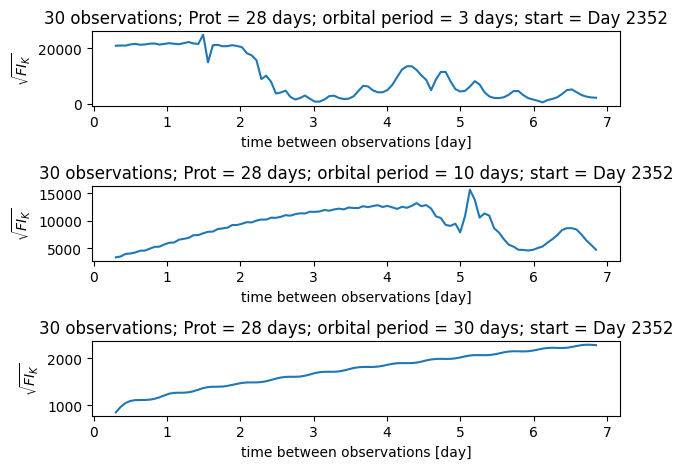

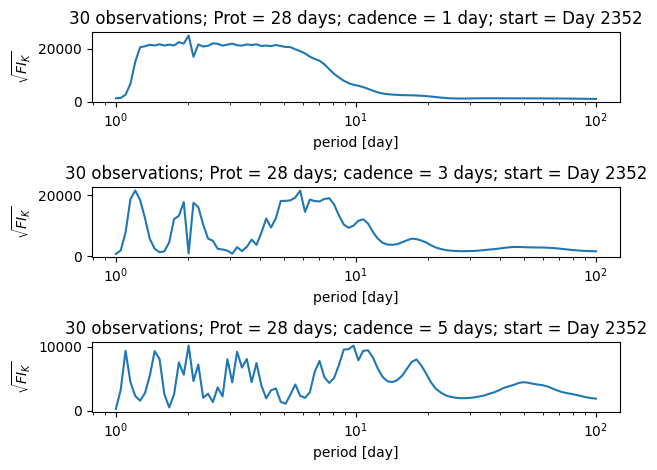

In [804]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [805]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2355

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2753767266.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:46<00:00,  2.16it/s]


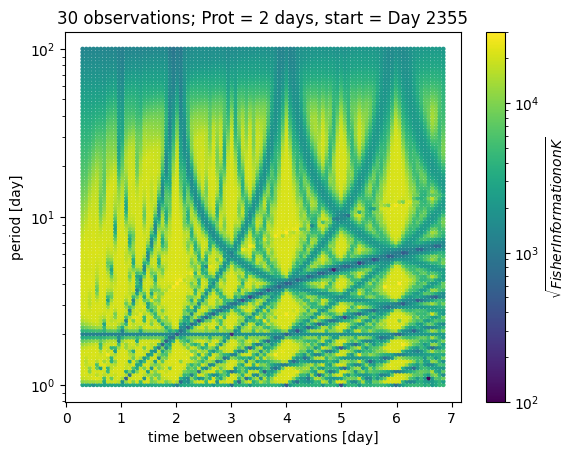

In [806]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days, start = Day {start}")
plt.savefig("plots/prot/fim_prot2_start2355.pdf", format="pdf")
plt.show()

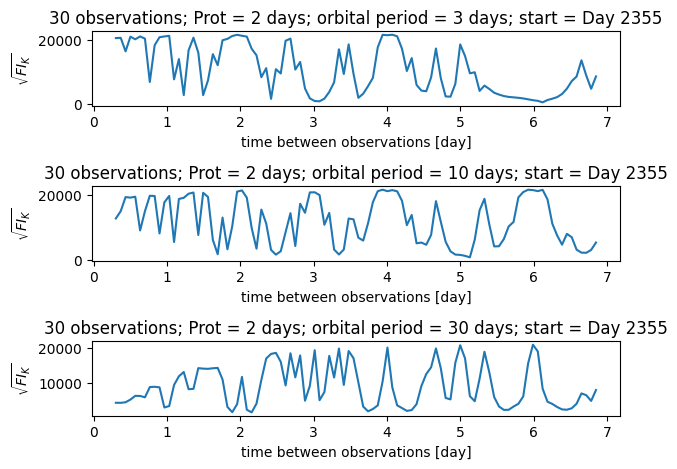

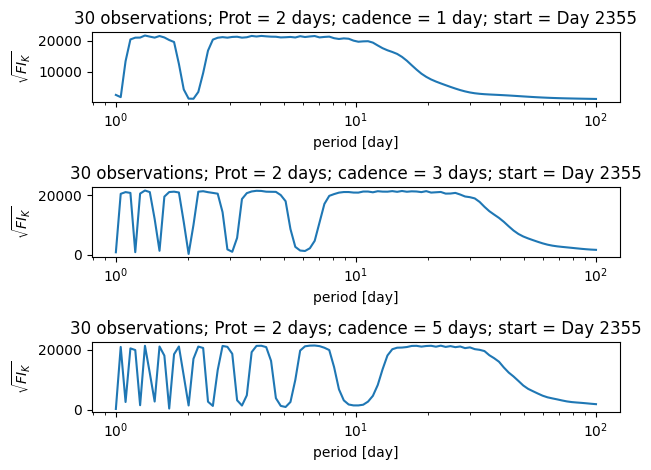

In [807]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [808]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 8 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2355

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2143296848.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.12it/s]


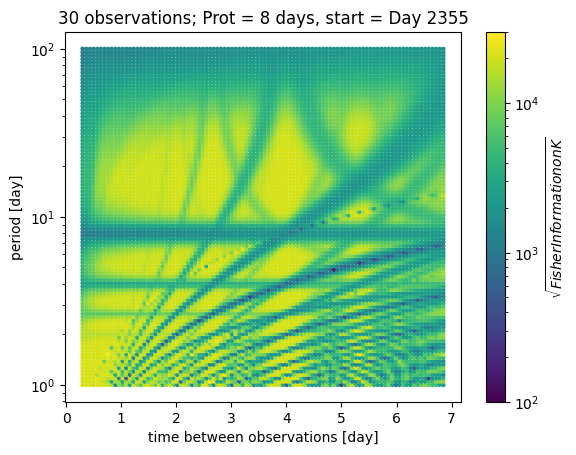

In [809]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days, start = Day {start}")
plt.savefig("plots/prot/fim_prot8_start2355.pdf", format="pdf")
plt.show()

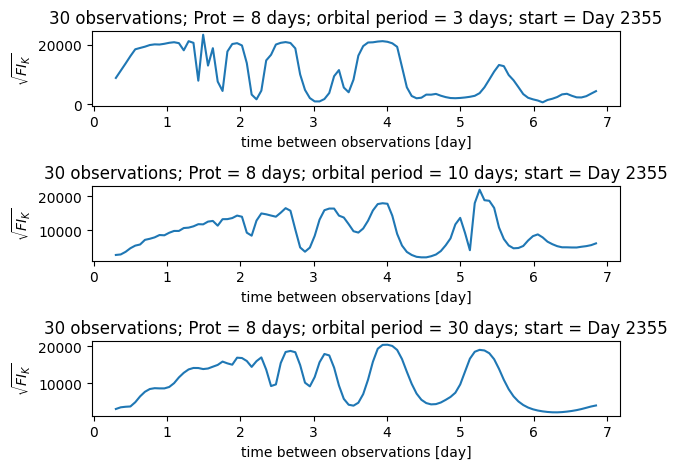

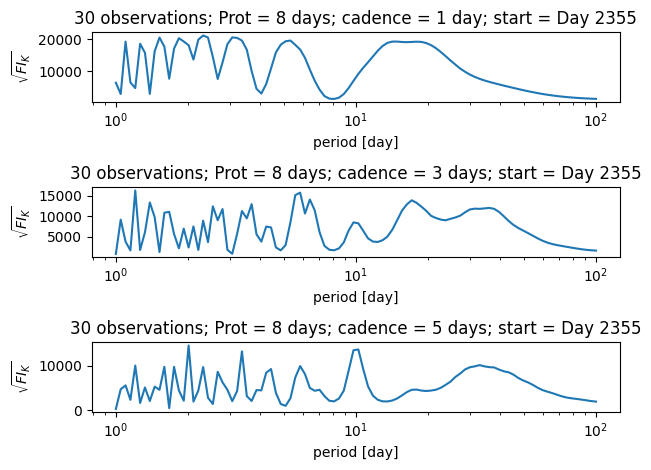

In [810]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [811]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 28 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2355

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/3710777387.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.12it/s]


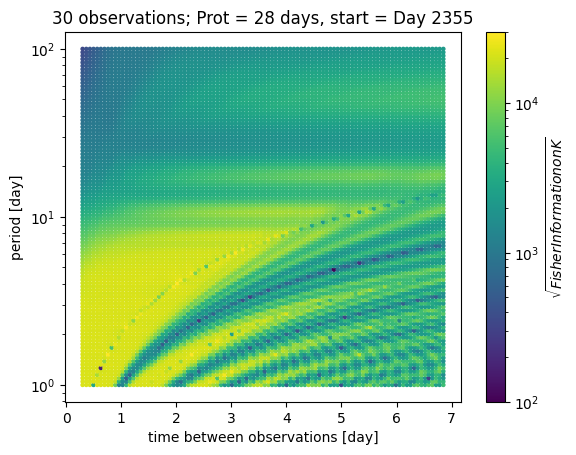

In [812]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days, start = Day {start}")
plt.savefig("plots/prot/fim_prot28_start2355.pdf", format="pdf")
plt.show()

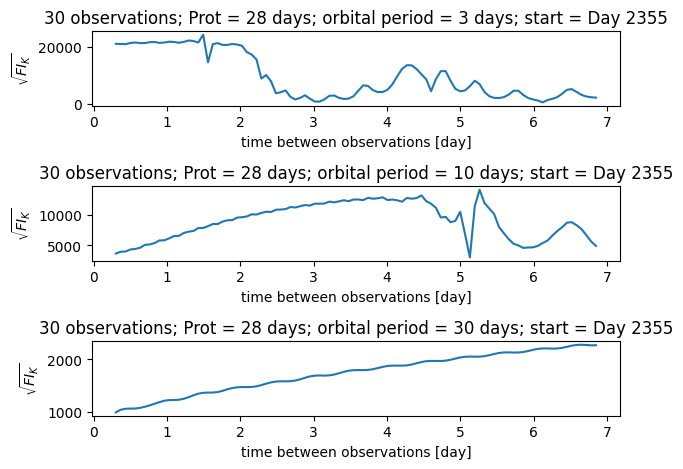

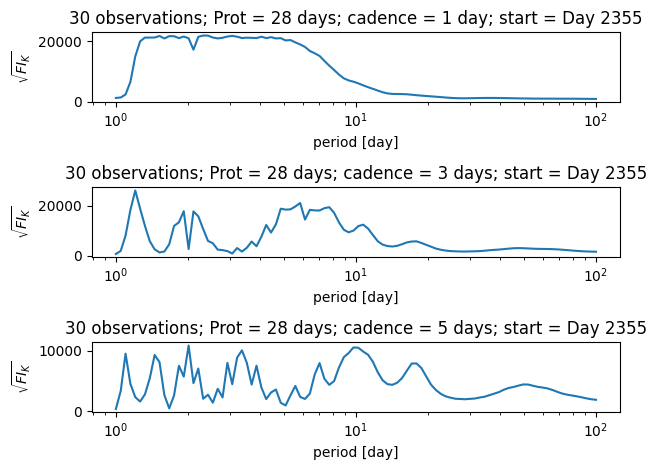

In [813]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [814]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2358

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/3636969558.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:51<00:00,  1.96it/s]


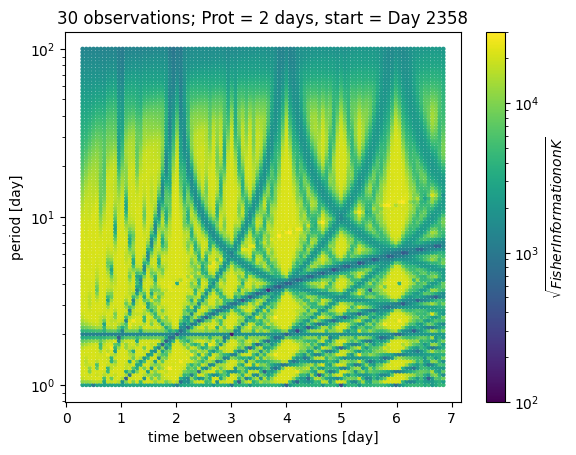

In [815]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days, start = Day {start}")
plt.savefig("plots/prot/fim_prot2_start2358.pdf", format="pdf")
plt.show()

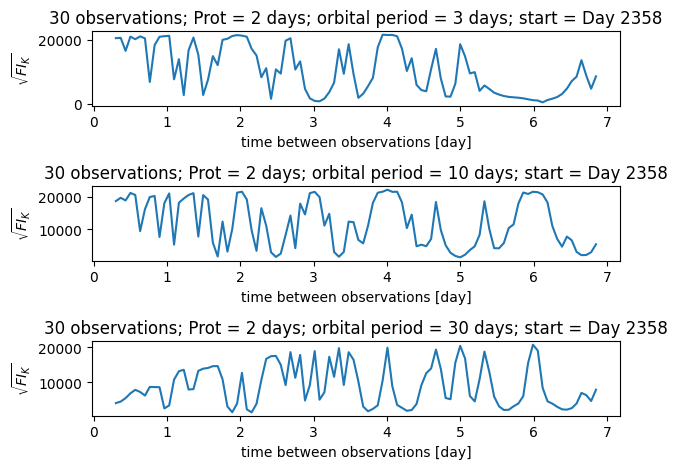

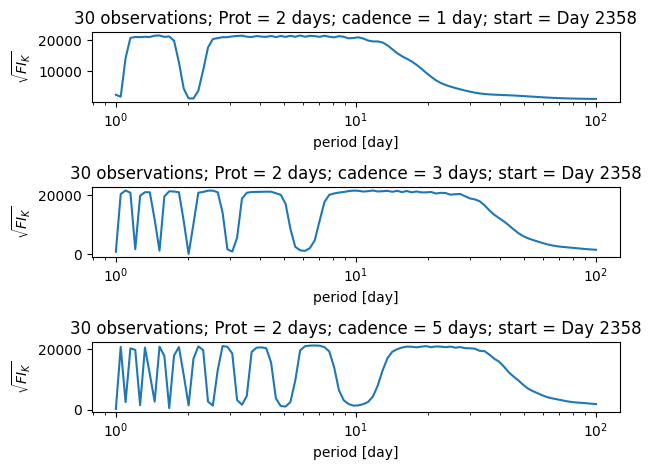

In [816]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [835]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 8 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 100 #40 # 500
start = 2358

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/79975398.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [08:40<00:00,  5.21s/it]


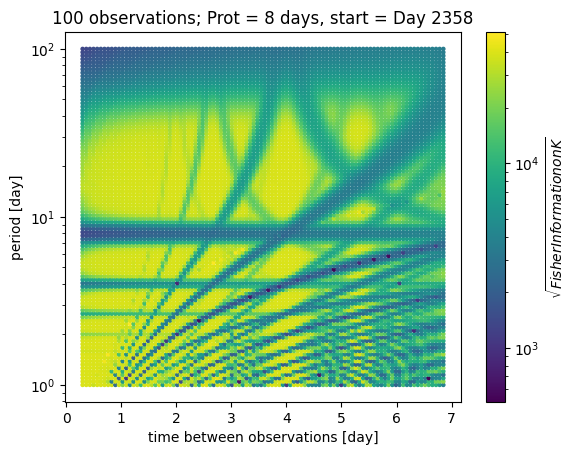

In [836]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm()) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days, start = Day {start}")
plt.savefig("plots/prot/fim_prot8_start2358.pdf", format="pdf")
plt.show()

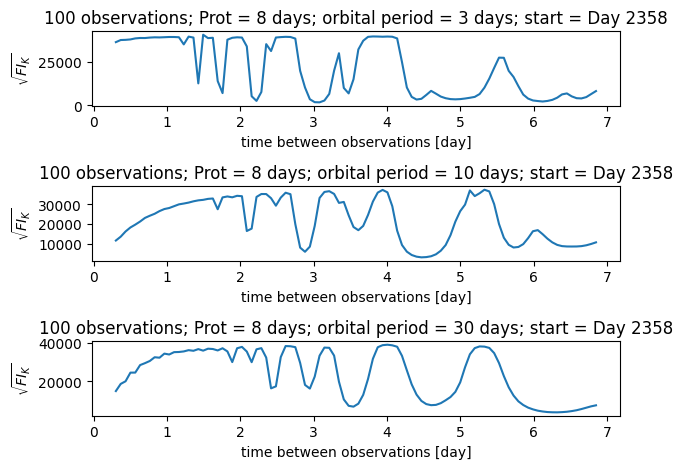

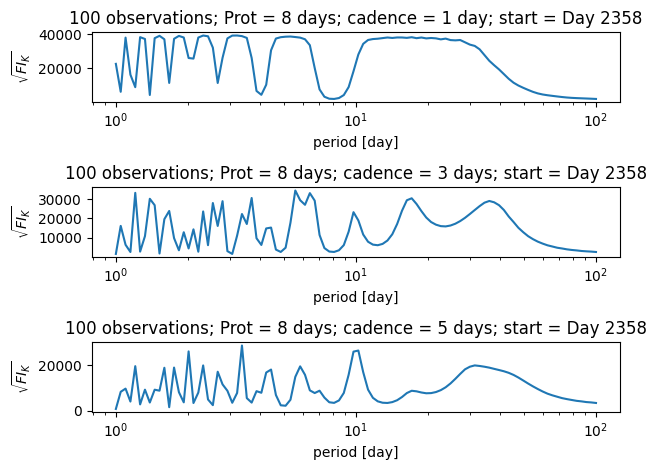

In [819]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [820]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
#Tau = 5 # 5, 30, 50, 100
Prot = 28 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2358 #2358

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/1141852739.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:54<00:00,  1.82it/s]


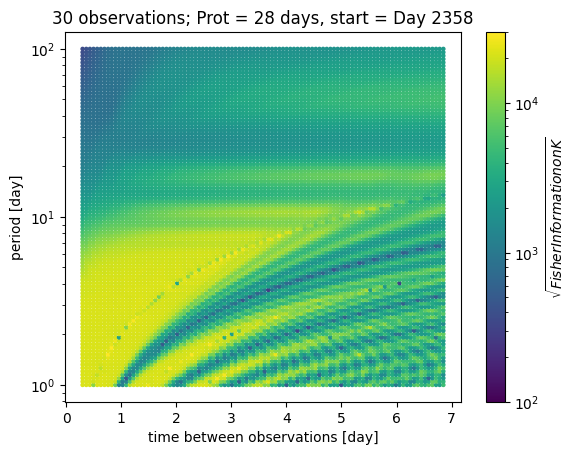

In [821]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot} days, start = Day {start}")
plt.savefig("plots/prot/fim_prot28_start2358.pdf", format="pdf")
plt.show()

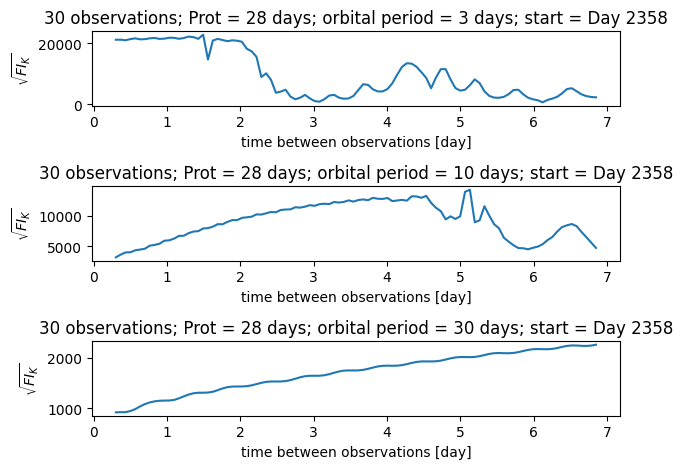

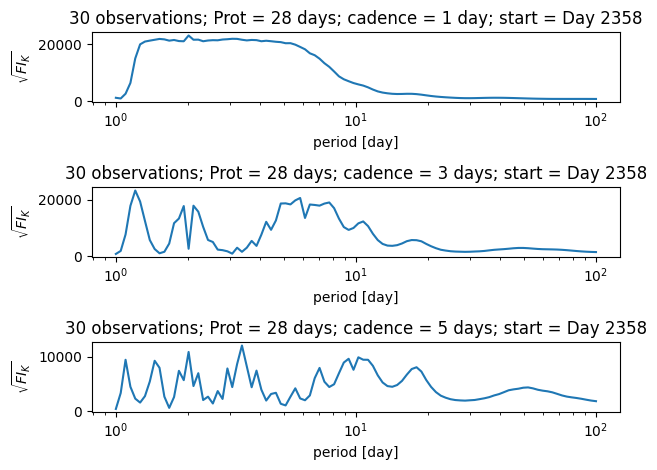

In [822]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_prot{Prot}_start{start}_cadences.pdf", format="pdf")
plt.show()

#### Vary Tau

In [20]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
Tau = 5 # 5, 30, 50, 100
#Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                   | 0/100 [00:00<?, ?it/s]/var/folders/fm/fpkllzw93kq7c5y3zl98167m0000gn/T/ipykernel_20990/3917596601.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████| 100/100 [01:40<00:00,  1.01s/it]


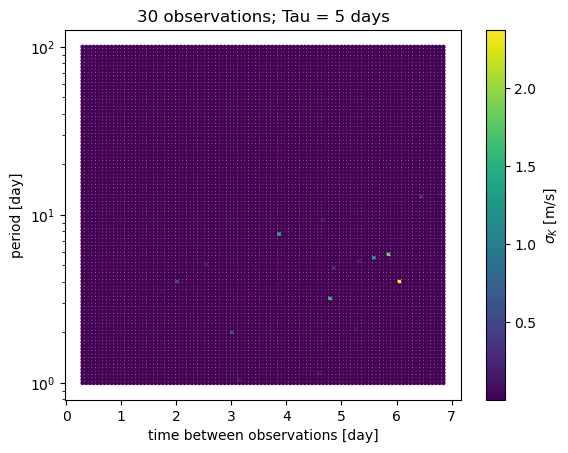

In [23]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=sigma_ks, s=5)#, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
#cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
cbar.ax.set_ylabel(r"$\sigma_K$ [m/s]")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Tau = {Tau} days")
plt.savefig(path+"plots/sigmak_tau5.pdf", format="pdf")
plt.show()

In [732]:
print(periods[24])
print(periods[50])
print(periods[73])

print(cadences[11])
print(cadences[41])
print(cadences[71])

3.0538555088334154
10.235310218990262
29.836472402833405
1.0277777777777777
3.012626262626262
4.997474747474747


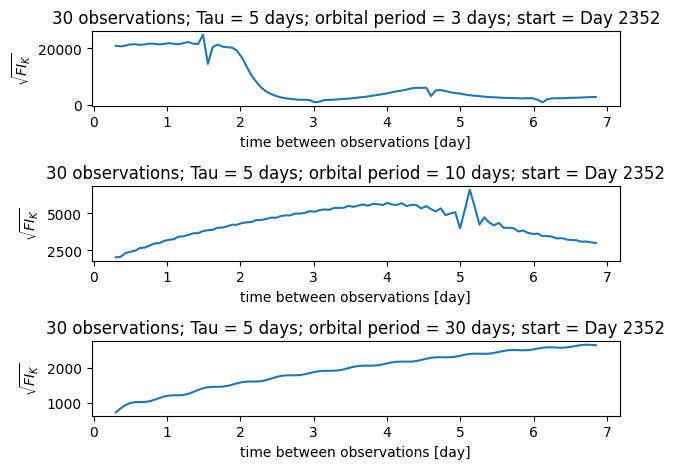

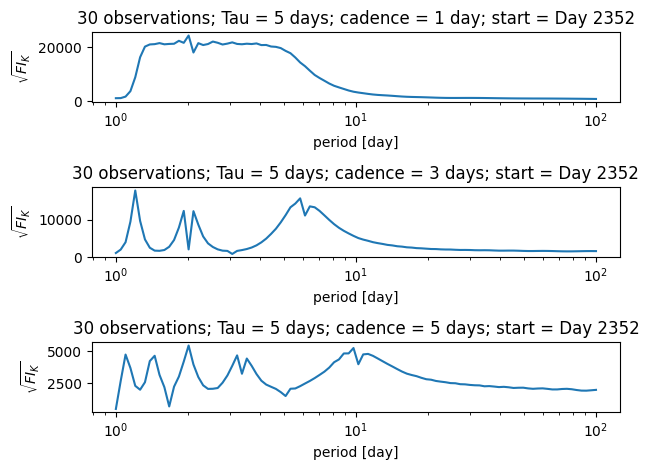

In [825]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_tau{Tau}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_tau{Tau}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [826]:
Tau = 5 # 5, 30, 50, 100
start = 2355

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/3626499900.py:28: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:49<00:00,  2.03it/s]


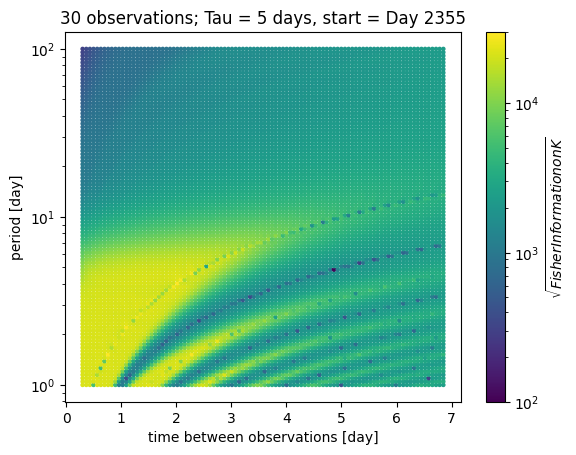

In [827]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Tau = {Tau} days, start = Day {start}")
plt.savefig("plots/tau/fim_tau5_start2355.pdf", format="pdf")
plt.show()

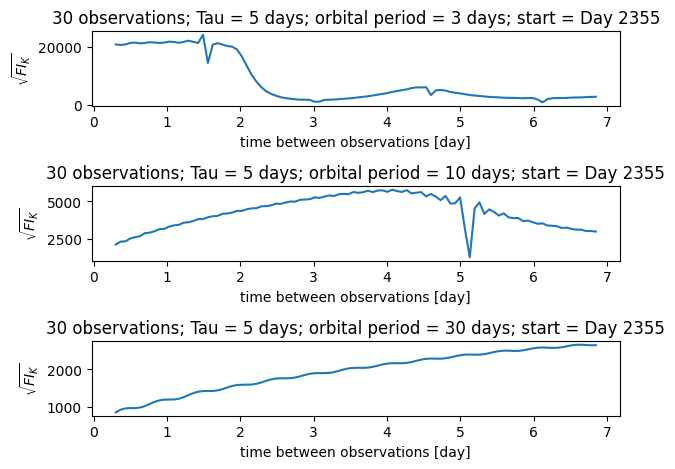

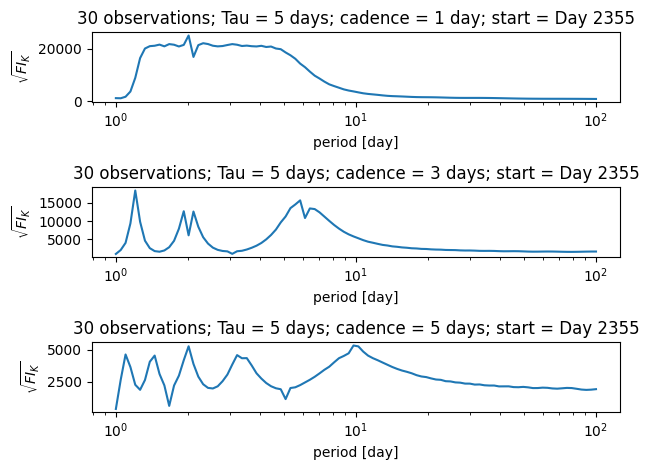

In [828]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_tau{Tau}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_tau{Tau}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [18]:
Tau = 30 # 5, 30, 50, 100

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                   | 0/100 [00:00<?, ?it/s]/var/folders/fm/fpkllzw93kq7c5y3zl98167m0000gn/T/ipykernel_20990/103515365.py:27: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████| 100/100 [01:47<00:00,  1.07s/it]


FileNotFoundError: [Errno 2] No such file or directory: 'plots/fim_tau30.pdf'

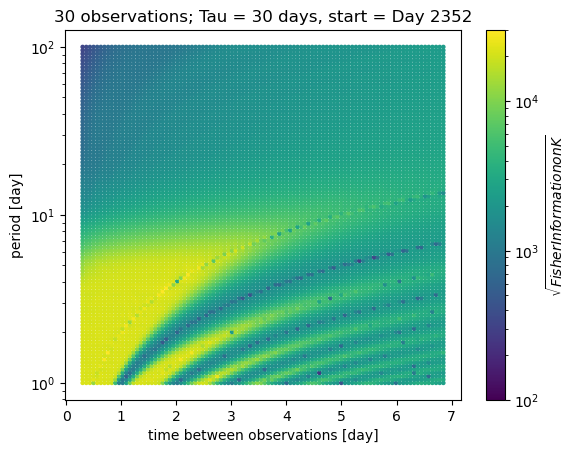

In [19]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
#plt.ylim([0, 100])
plt.yscale('log')
plt.title(f"{n_obs} observations; Tau = {Tau} days")
plt.savefig("plots/fim_tau30.pdf", format="pdf")
plt.show()

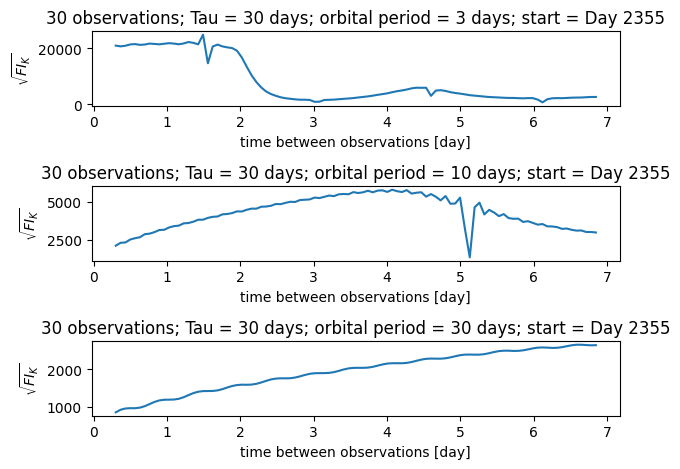

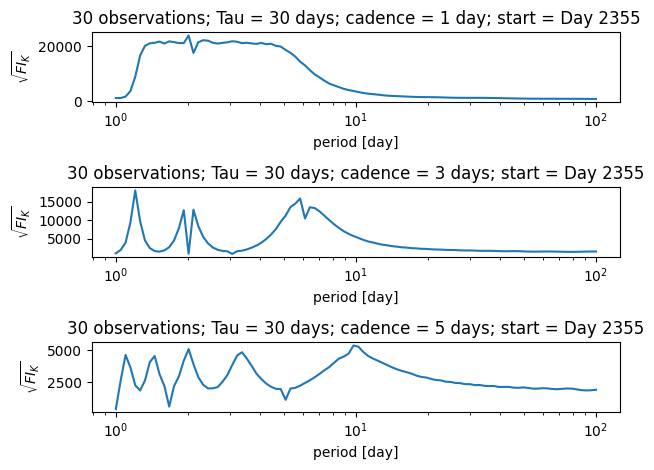

In [831]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_tau{Tau}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_tau{Tau}_start{start}_cadences.pdf", format="pdf")
plt.show()

In [ ]:
Tau = 100 # 5, 30, 50, 100

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

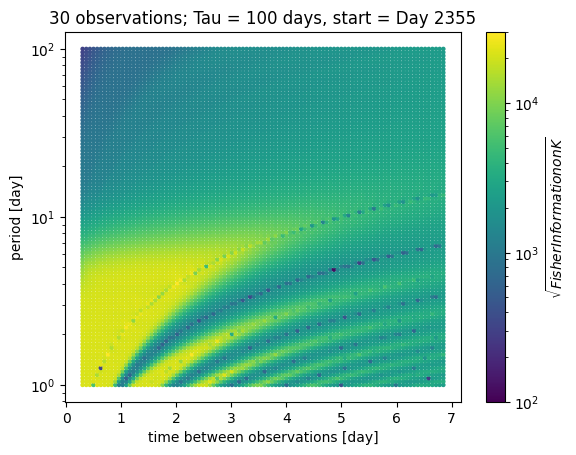

In [833]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) # vmin=1e5, vmax=1e10
cbar = plt.colorbar()
cbar.ax.set_ylabel(r"$\sqrt{Fisher Information on K}$")
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
#plt.ylim([0, 100])
plt.yscale('log')
plt.title(f"{n_obs} observations; Tau = {Tau} days, start = Day {start}")
plt.savefig("plots/fim_tau100.pdf", format="pdf")
plt.show()

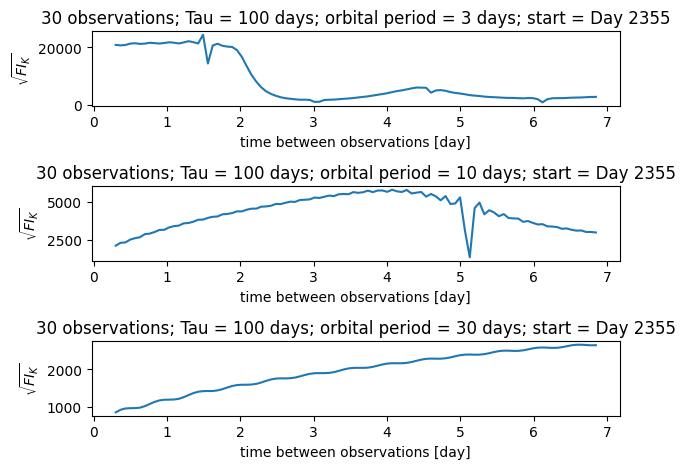

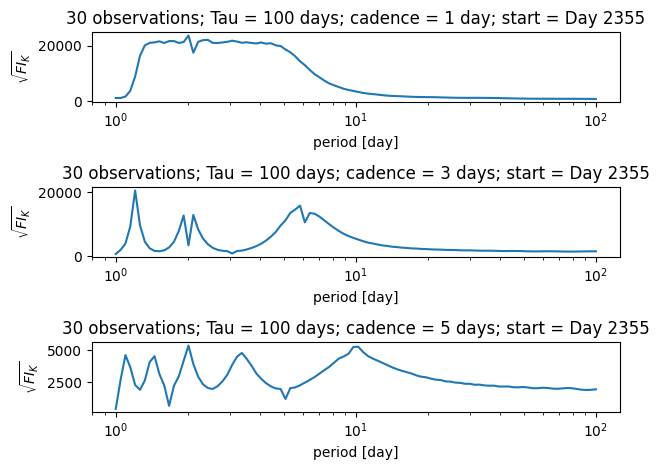

In [834]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Tau = {Tau} days; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_tau{Tau}_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; Tau = {Tau} days; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/prot/fim_tau{Tau}_start{start}_cadences.pdf", format="pdf")
plt.show()

#### Eta

In [837]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
eta = 0.1 # 0.1, 0.5, 0.9
#Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2819158221.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.10it/s]


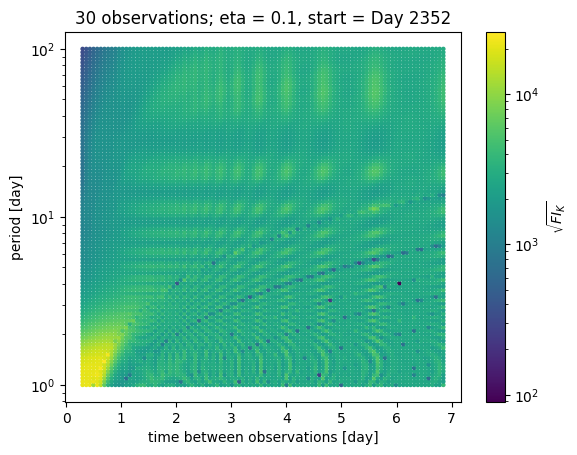

In [ ]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; eta = {eta}, start = Day {start}")
plt.savefig(f"plots/eta/fim_eta01_start{start}.pdf", format="pdf")
plt.show()

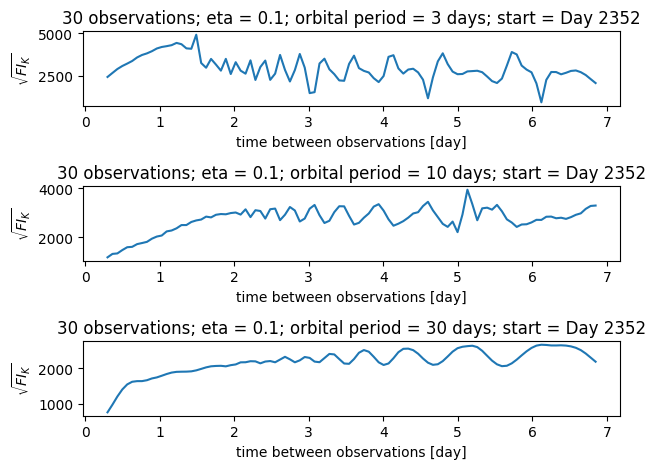

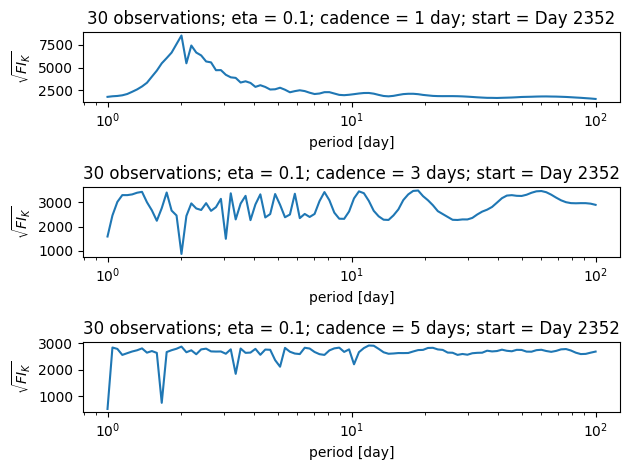

In [842]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta01_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; eta = {eta}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; eta = {eta}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; eta = {eta}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta01_start{start}_cadences.pdf", format="pdf")
plt.show()

In [843]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
eta = 0.3 # 0.1, 0.5, 0.9
#Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2920258870.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.11it/s]


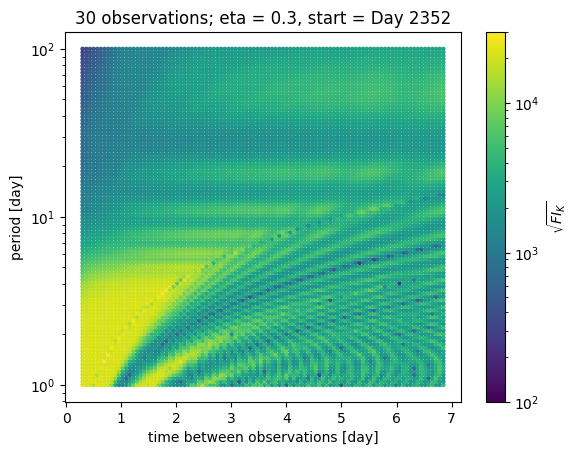

In [844]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; eta = {eta}, start = Day {start}")
plt.savefig(f"plots/eta/fim_eta03_start{start}.pdf", format="pdf")
plt.show()

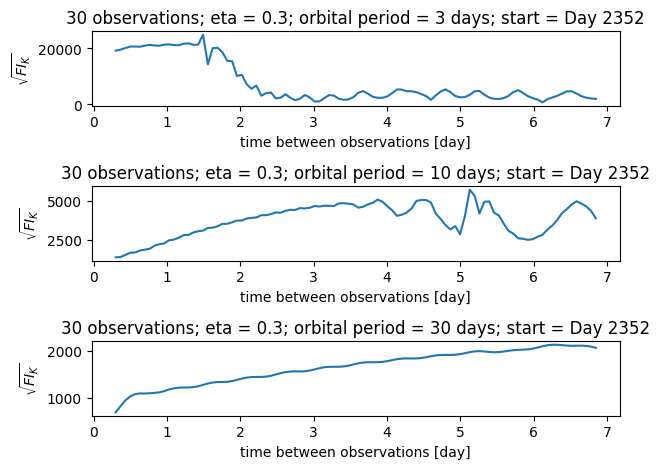

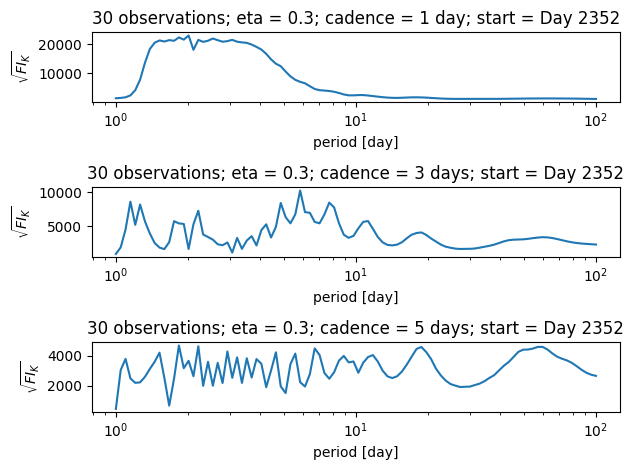

In [845]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta03_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; eta = {eta}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; eta = {eta}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; eta = {eta}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta03_start{start}_cadences.pdf", format="pdf")
plt.show()

In [846]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
eta = 0.5 # 0.1, 0.5, 0.9
#Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/4022176671.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:48<00:00,  2.08it/s]


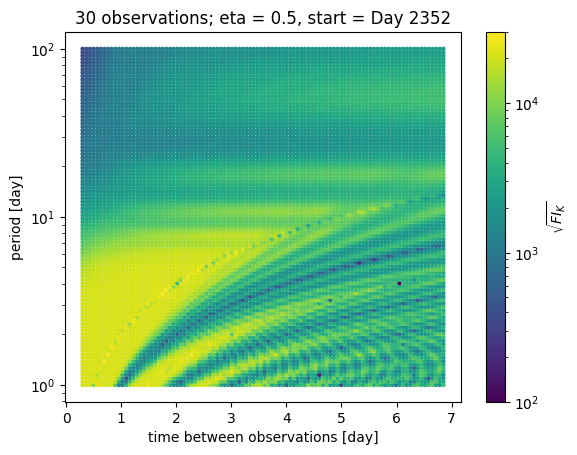

In [847]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; eta = {eta}, start = Day {start}")
plt.savefig(f"plots/eta/fim_eta05_start{start}.pdf", format="pdf")
plt.show()

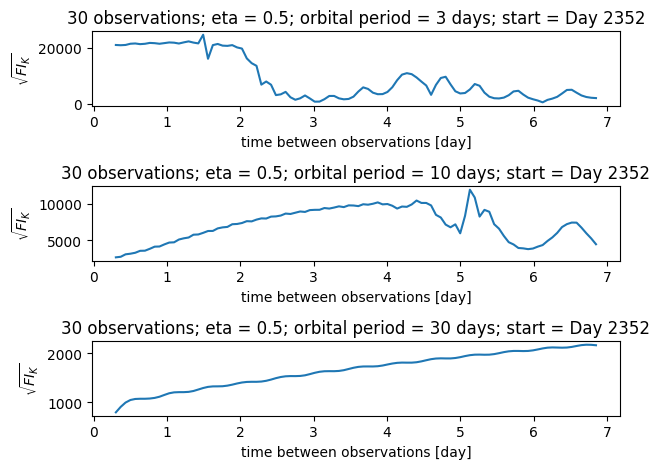

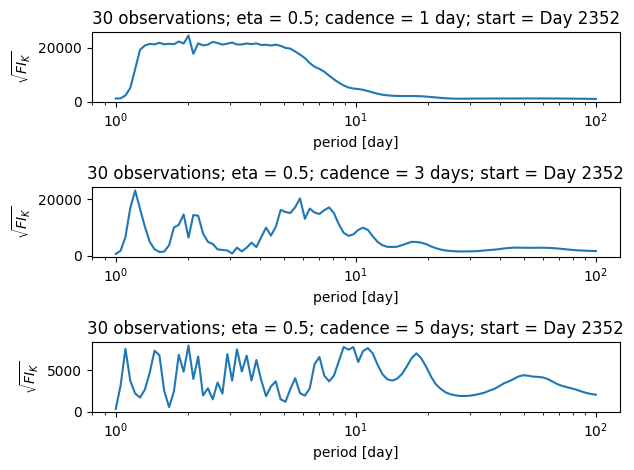

In [848]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta05_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; eta = {eta}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; eta = {eta}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; eta = {eta}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta05_start{start}_cadences.pdf", format="pdf")
plt.show()

In [849]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
eta = 0.9 # 0.1, 0.5, 0.9
#Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/788224289.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.12it/s]


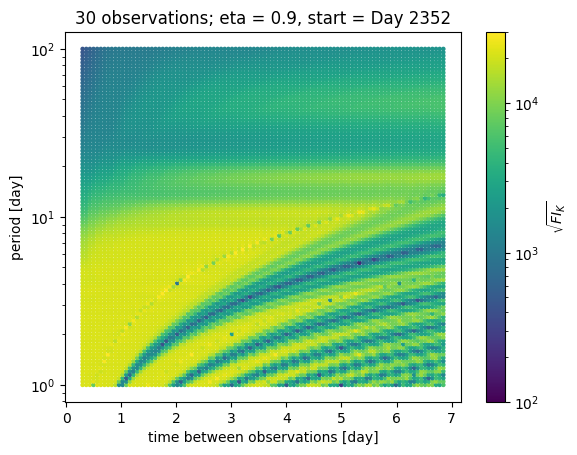

In [850]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; eta = {eta}, start = Day {start}")
plt.savefig(f"plots/eta/fim_eta09_start{start}.pdf", format="pdf")
plt.show()

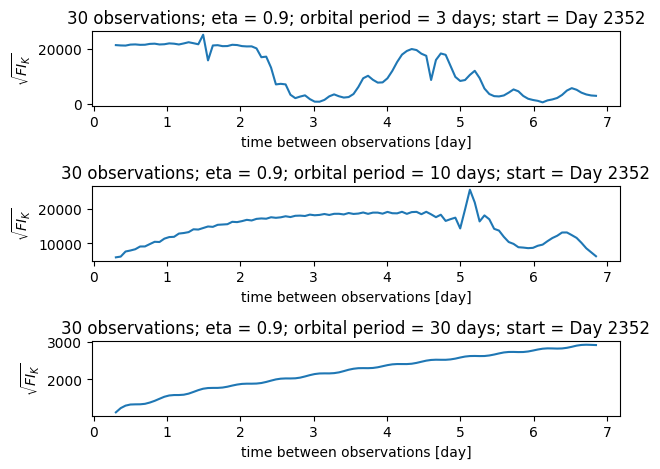

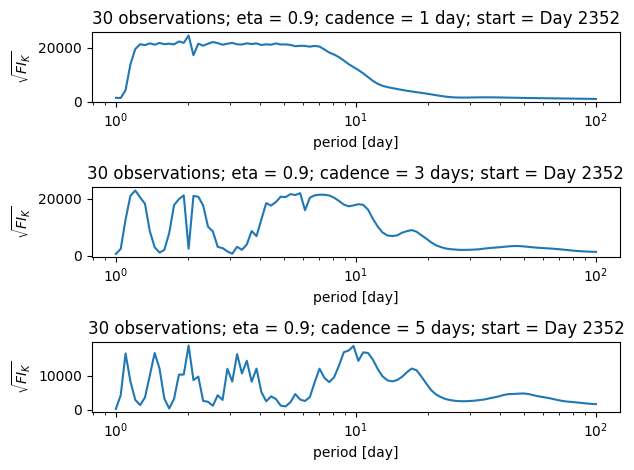

In [851]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta09_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; eta = {eta}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; eta = {eta}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; eta = {eta}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta09_start{start}_cadences.pdf", format="pdf")
plt.show()

In [852]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
eta = 0.9 # 0.1, 0.5, 0.9
#Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 100 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/41683277.py:46: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [09:02<00:00,  5.43s/it]


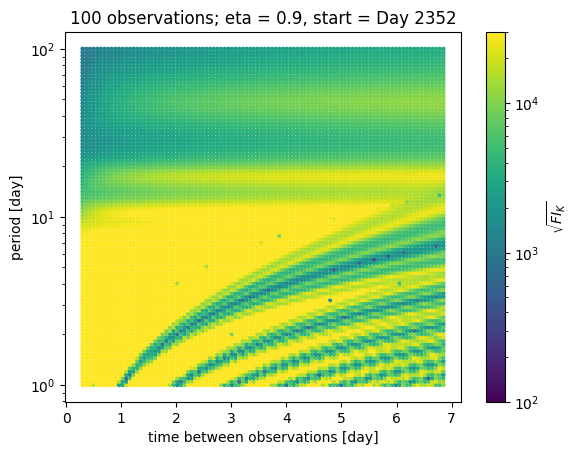

In [853]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; eta = {eta}, start = Day {start}")
plt.savefig(f"plots/eta/fim_eta09_start{start}_100obs.pdf", format="pdf")
plt.show()

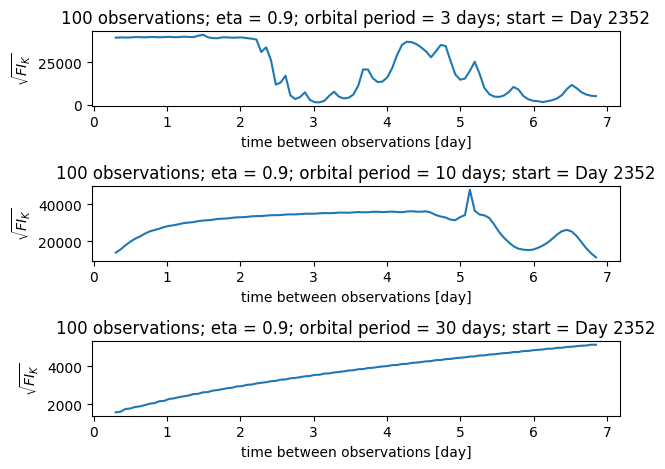

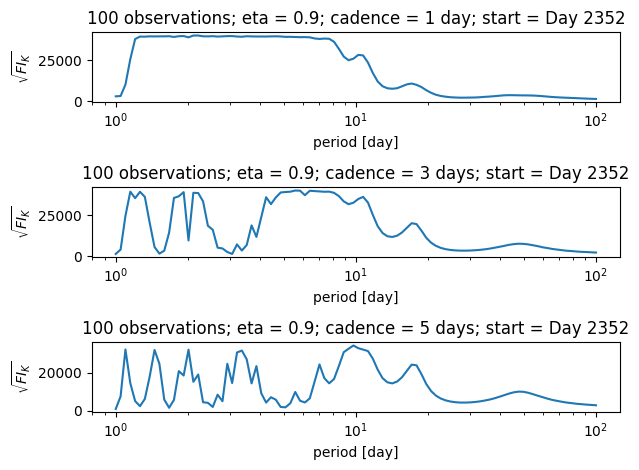

In [854]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; eta = {eta}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta09_start{start}_periods_100obs.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; eta = {eta}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; eta = {eta}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; eta = {eta}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/eta/fim_eta09_start{start}_cadences_100obs.pdf", format="pdf")
plt.show()

#### Sigma_QP

In [855]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
sigma_qp_s = 1e-5 # 1e-5, 1e-3, 1e-1
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/920607879.py:45: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:45<00:00,  2.18it/s]


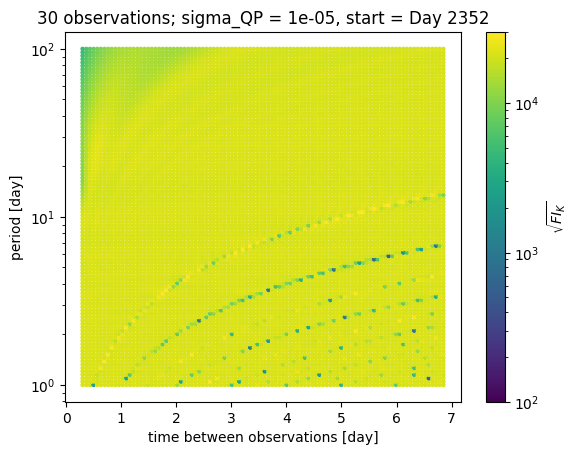

In [858]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}, start = Day {start}")
plt.savefig(f"plots/sigma-qp/fim_sigmaqp5_start{start}.pdf", format="pdf")
plt.show()

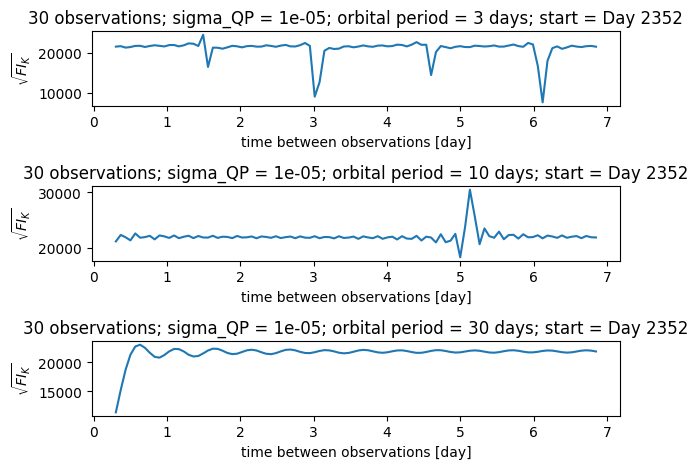

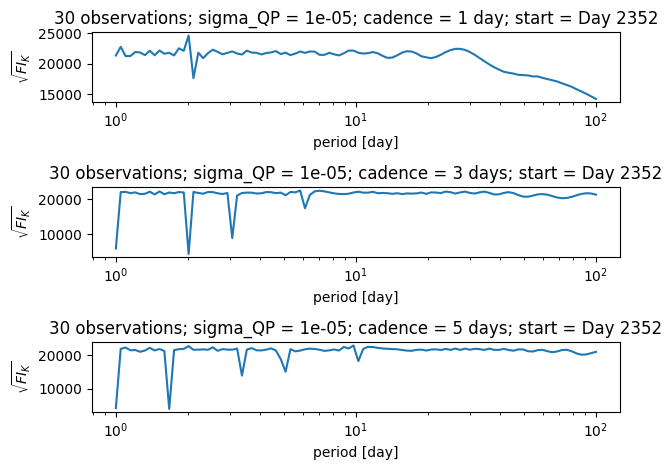

In [859]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/sigma-qp/fim_sigmaqp5_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/sigma-qp/fim_sigmaqp5_start{start}_cadences.pdf", format="pdf")
plt.show()

In [860]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
sigma_qp_s = 1e-3 # 1e-5, 1e-3, 1e-1
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2438259198.py:45: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.10it/s]


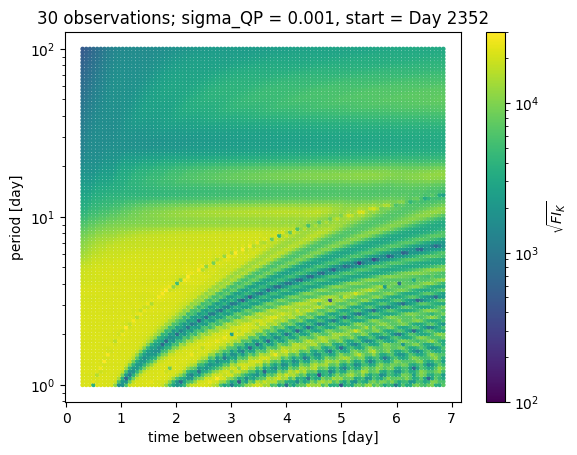

In [861]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}, start = Day {start}")
plt.savefig(f"plots/sigma-qp/fim_sigmaqp3_start{start}.pdf", format="pdf")
plt.show()

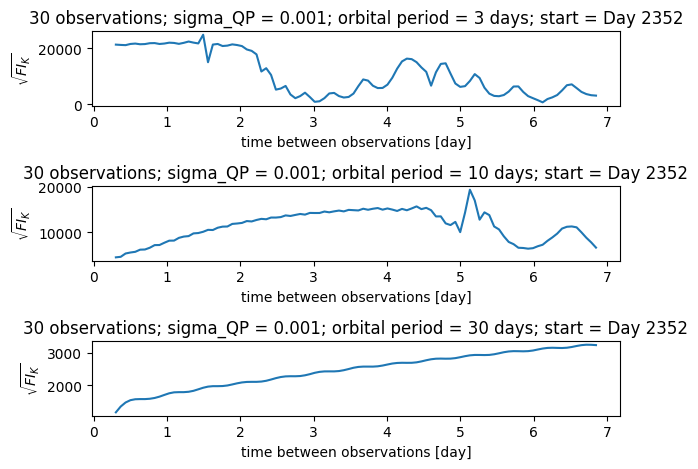

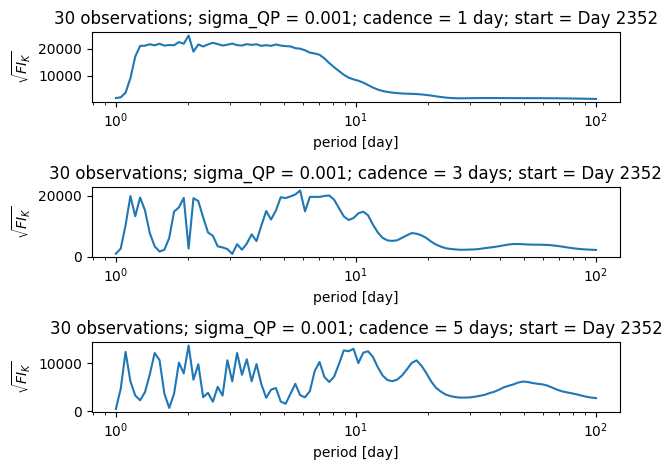

In [862]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/sigma-qp/fim_sigmaqp3_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/sigma-qp/fim_sigmaqp3_start{start}_cadences.pdf", format="pdf")
plt.show()

In [863]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
sigma_qp_s = 1e-1 # 1e-5, 1e-3, 1e-1
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/3153877622.py:45: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:51<00:00,  1.96it/s]


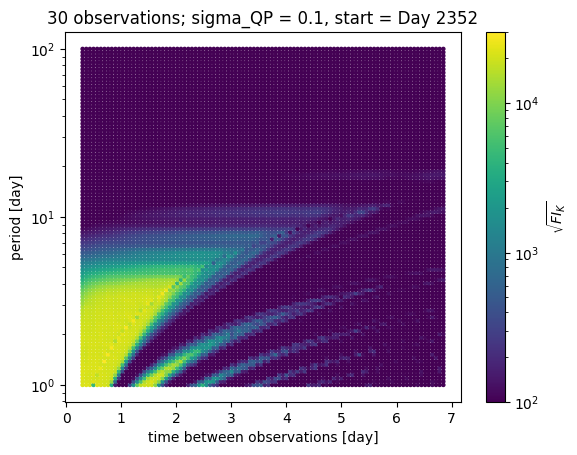

In [864]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}, start = Day {start}")
plt.savefig(f"plots/sigma-qp/fim_sigmaqp1_start{start}.pdf", format="pdf")
plt.show()

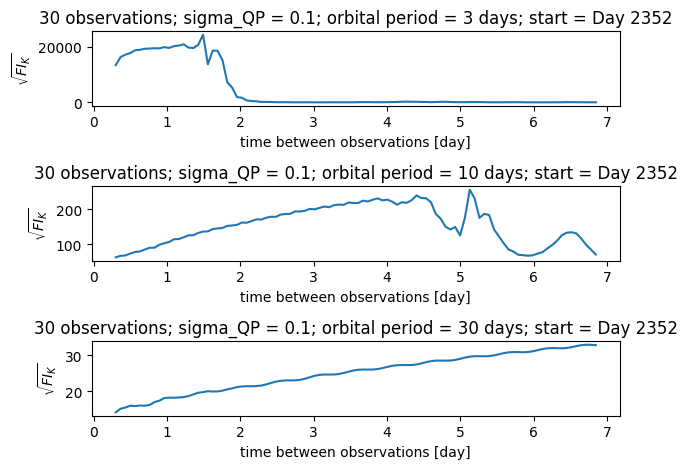

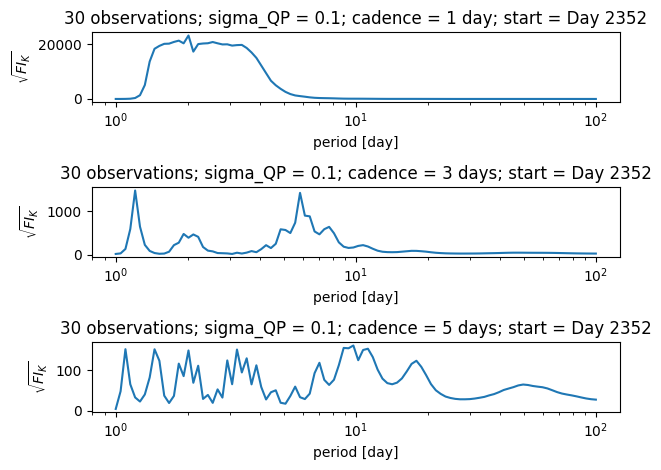

In [865]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/sigma-qp/fim_sigmaqp1_start{start}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/sigma-qp/fim_sigmaqp1_start{start}_cadences.pdf", format="pdf")
plt.show()

In [866]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
sigma_qp_s = 1e-1 # 1e-5, 1e-3, 1e-1
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 100 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))


for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        strat = gappy(n_obs = n_obs, cadence = c, start = start)

        sigma = cov_matrix(strat, params)
        sigma += 1e-6 
        #sigma = inv(sigma) # I want the inverse of the covariance matrix for FIM

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        ###sigma_ks_stable[enum1][enum2] = sigma_k_stable
        ###sigma_ks_solve[enum1][enum2] = sigma_k_solve
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2867389584.py:45: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [09:20<00:00,  5.61s/it]


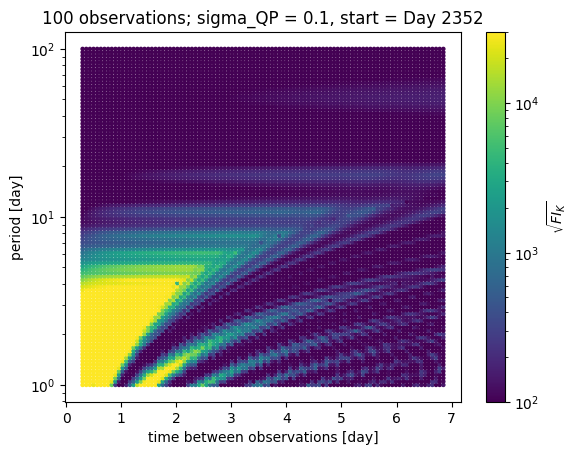

In [867]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}, start = Day {start}")
plt.savefig(f"plots/sigma-qp/fim_sigmaqp1_start{start}_100obs.pdf", format="pdf")
plt.show()

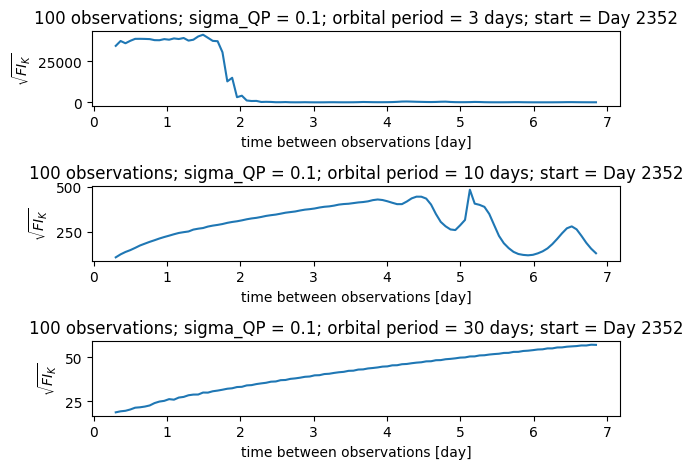

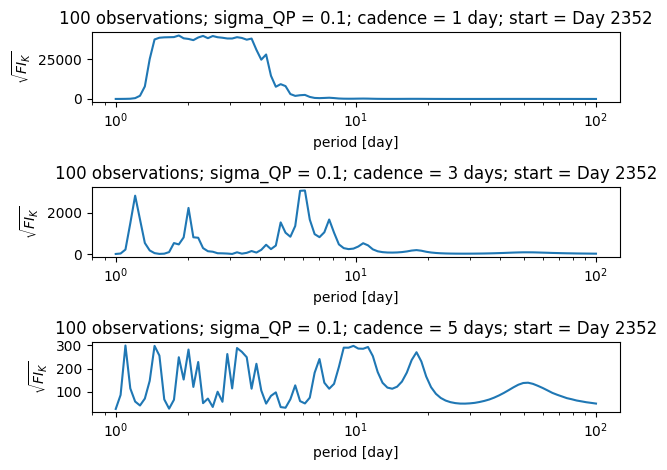

In [868]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 3 days; start = Day {start}")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 10 days; start = Day {start}")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; orbital period = 30 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/sigma-qp/fim_sigmaqp1_start{start}_periods_100obs.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
ax1.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 1 day; start = Day {start}")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 3 days; start = Day {start}")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
ax3.set_title(f"{n_obs} observations; sigma_QP = {sigma_qp_s}; cadence = 5 days; start = Day {start}")

plt.tight_layout()
plt.savefig(f"plots/sigma-qp/fim_sigmaqp1_start{start}_cadences_100obs.pdf", format="pdf")
plt.show()

#### Vary Prot, but now with unevenly spaced sampling

In [875]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
Prot = 2 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))

### introduce uneven sampling
dropout = 0.1

# two weeks on, two weeks off, two weeks on, two weeks off, fill remainder
offs = [[start+14, start+28], [start+42, start+56], [start+70, start+84]] 
#offs = [[start+14, start+28], [start+42, start+56]] 

for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        #strat = gappy(n_obs = n_obs, cadence = c, start = start)
        strat = gappy(n_obs = n_obs, cadence = c, start = start, offs = offs, dropout = dropout)
        
        sigma = cov_matrix(strat, params)
        sigma += 1e-6 

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2467644051.py:51: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:38<00:00,  2.57it/s]


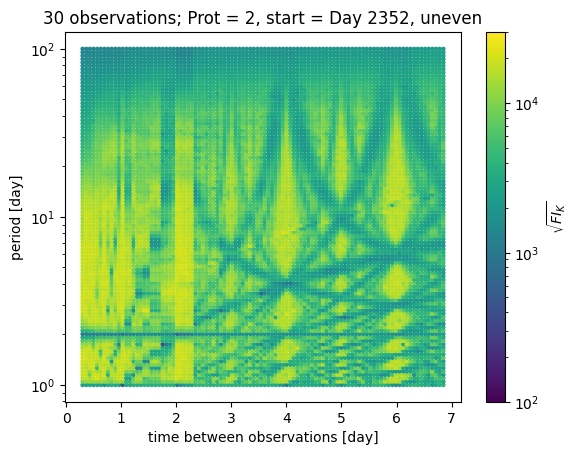

In [876]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot}, start = Day {start}, uneven")
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_start{start}.pdf", format="pdf")
plt.show()

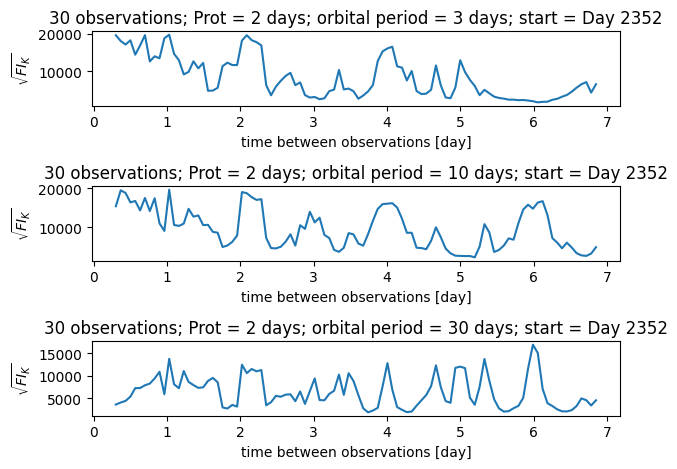

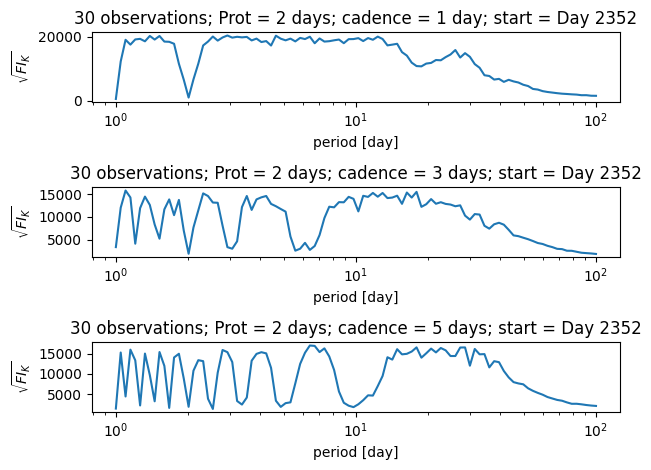

In [877]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day 2352")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day 2352")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day 2352")

plt.tight_layout()
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day 2352")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day 2352")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day 2352")

plt.tight_layout()
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_cadences.pdf", format="pdf")
plt.show()

In [878]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
Prot = 8 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))

### introduce uneven sampling
dropout = 0.1

# two weeks on, two weeks off, two weeks on, two weeks off, fill remainder
offs = [[start+14, start+28], [start+42, start+56], [start+70, start+84]] 
#offs = [[start+14, start+28], [start+42, start+56]] 

for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        #strat = gappy(n_obs = n_obs, cadence = c, start = start)
        strat = gappy(n_obs = n_obs, cadence = c, start = start, offs = offs, dropout = dropout)
        
        sigma = cov_matrix(strat, params)
        sigma += 1e-6 

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/3647295340.py:51: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:38<00:00,  2.62it/s]


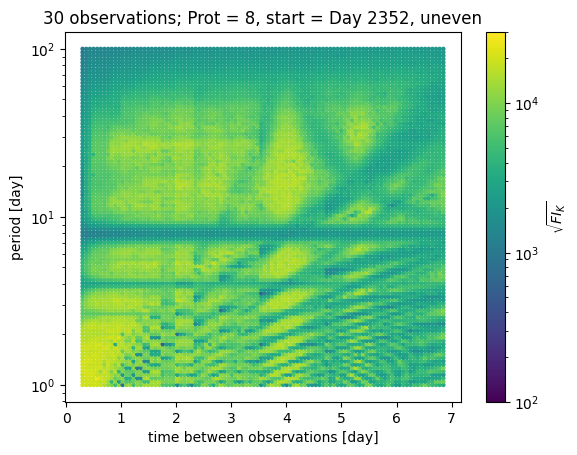

In [879]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot}, start = Day {start}, uneven")
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_start{start}.pdf", format="pdf")
plt.show()

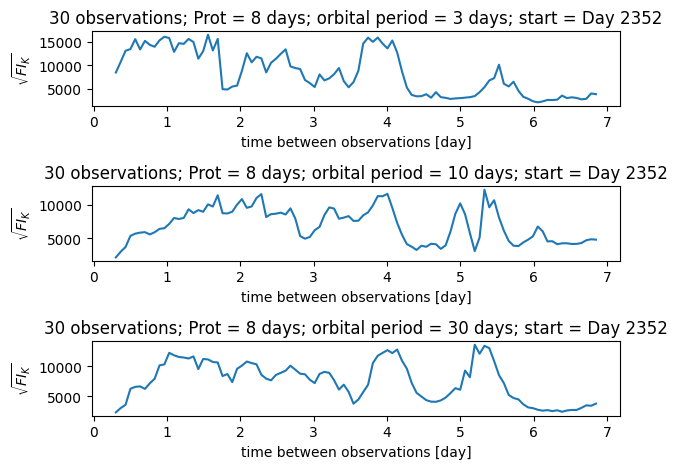

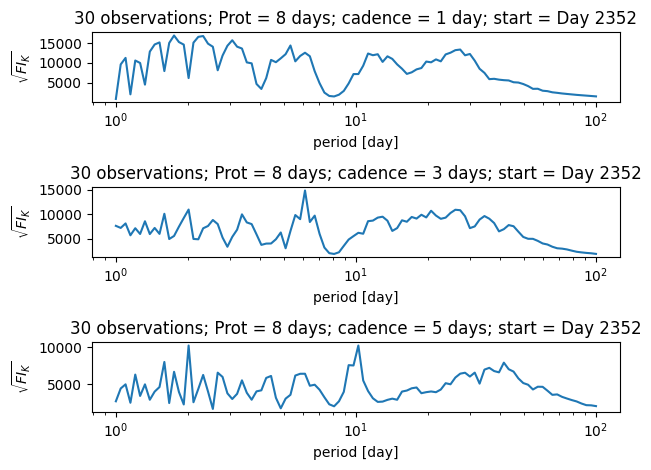

In [880]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day 2352")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day 2352")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day 2352")

plt.tight_layout()
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day 2352")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day 2352")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day 2352")

plt.tight_layout()
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_cadences.pdf", format="pdf")
plt.show()

In [881]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
Prot = 28 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 30 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))

### introduce uneven sampling
dropout = 0.1

# two weeks on, two weeks off, two weeks on, two weeks off, fill remainder
offs = [[start+14, start+28], [start+42, start+56], [start+70, start+84]] 
#offs = [[start+14, start+28], [start+42, start+56]] 

for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        #strat = gappy(n_obs = n_obs, cadence = c, start = start)
        strat = gappy(n_obs = n_obs, cadence = c, start = start, offs = offs, dropout = dropout)
        
        sigma = cov_matrix(strat, params)
        sigma += 1e-6 

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/2704631139.py:51: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:41<00:00,  2.43it/s]


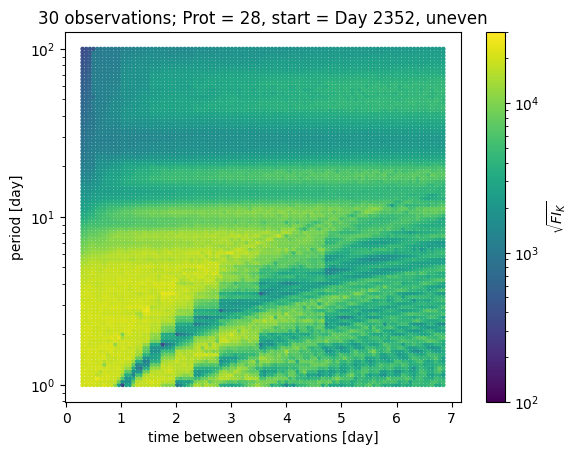

In [882]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=3e4)) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot}, start = Day {start}, uneven")
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_start{start}.pdf", format="pdf")
plt.show()

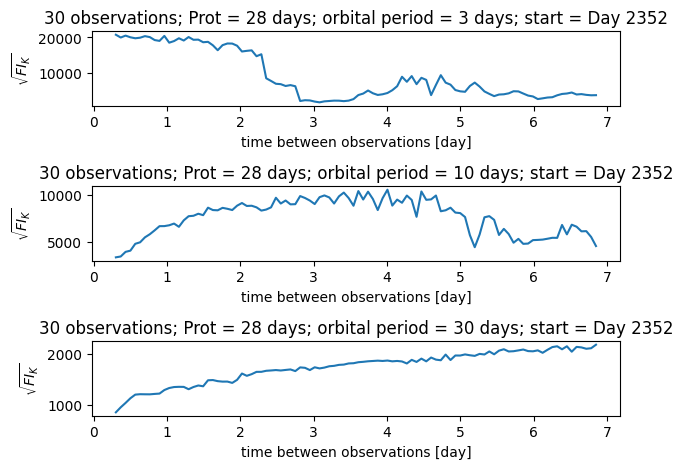

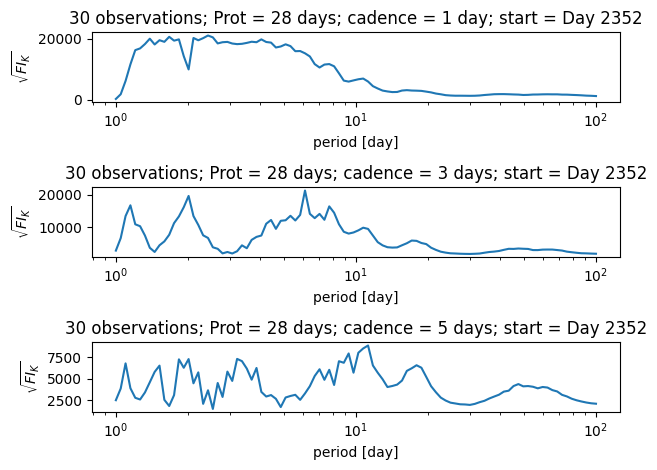

In [883]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day 2352")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day 2352")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day 2352")

plt.tight_layout()
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_periods.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day 2352")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day 2352")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day 2352")

plt.tight_layout()
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_cadences.pdf", format="pdf")
plt.show()

In [884]:
# planet observation parameters
#periods = np.linspace(1, 30, 200)
#cadences = np.linspace(1, 7, 200)

# static correlated noise parameters
Tau = 23.6 # active region lifetime; days
eta = 0.58 # smoothing parameter
Prot = 28.1 # solar rotation period; days
sigma_qp_s = 1.43e-3 # correlated noise amplitude [cm/s]
sigma_wn_s = 0.178e-3 # white noise amplitude [cm/s]

### the parameter I'm varying
Prot = 28 # 2, 8, 28, 32
params = [Tau, eta, Prot, sigma_qp_s, sigma_wn_s]

cadences = np.linspace(0.30, 6.85, 100)
periods = np.logspace(0, 2, 100)
n_obs = 100 #40 # 500
start = 2352

sigma_k_test = []
sigma_k_solve_test = []
sigma_k_stable_test = []
fi_k_test = []

sigma_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_stable = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
sigma_ks_solve = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))
fi_ks = np.ones(len(periods)*len(cadences)).reshape((len(periods),len(cadences)))

### introduce uneven sampling
dropout = 0.1

# two weeks on, two weeks off, two weeks on, two weeks off, fill remainder
offs = [[start+14, start+28], [start+42, start+56], [start+70, start+84]] 
#offs = [[start+14, start+28], [start+42, start+56]] 

for enum_p, p in enumerate(tqdm(periods)):
    for enum_c, c in enumerate(cadences):
        
        test_theta = [test_K, p, test_T0]
        #strat = gappy(n_obs = n_obs, cadence = c, start = start)
        strat = gappy(n_obs = n_obs, cadence = c, start = start, offs = offs, dropout = dropout)
        
        sigma = cov_matrix(strat, params)
        sigma += 1e-6 

        args = np.array(strat), sigma, jnp.array(test_theta, dtype=float)
        fim = clam_jax_fim(*args).block_until_ready()
        inv_fim = inv(fim)
        sigma_k = np.sqrt(inv_fim)[0][0]
        
        fi_k = fim[0][0]
        
        # for 2D plots and testing
        sigma_ks[enum_p][enum_c] = sigma_k
        
        fi_ks[enum_p][enum_c] = fi_k
        

  0%|                                                                                                                                               | 0/100 [00:00<?, ?it/s]/var/folders/h2/sp_lfvz5515bhg_y92psw7f80000gn/T/ipykernel_62199/383382252.py:51: RuntimeWarning: invalid value encountered in sqrt
  sigma_k = np.sqrt(inv_fim)[0][0]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [07:19<00:00,  4.40s/it]


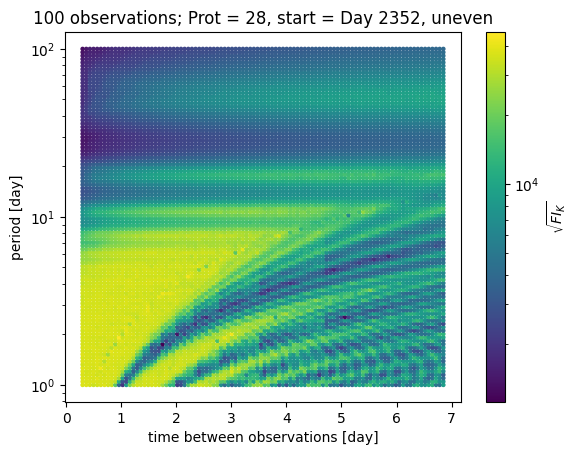

In [887]:
x, y = np.meshgrid(cadences, periods)
plt.scatter(x, y, c=np.sqrt(fi_ks), s=5, norm=matplotlib.colors.LogNorm()) 
cbar = plt.colorbar()
cbar.ax.set_ylabel(r'$\sqrt{FI_K}$')
plt.xlabel("time between observations [day]")
plt.ylabel("period [day]")
plt.yscale('log')
plt.title(f"{n_obs} observations; Prot = {Prot}, start = Day {start}, uneven")
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_start{start}_100obs.pdf", format="pdf")
plt.show()

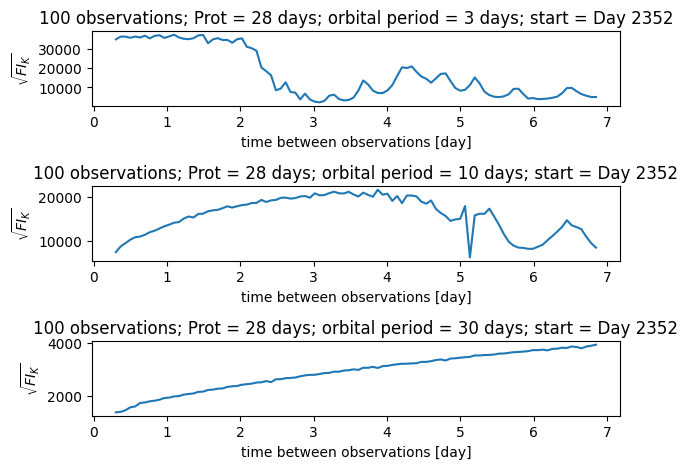

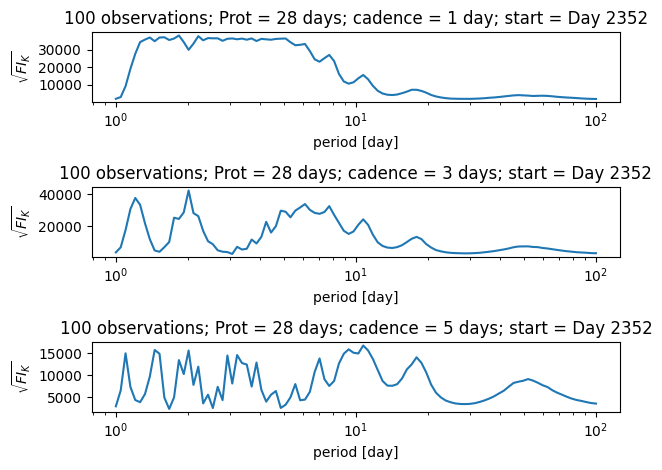

In [886]:
### try different periods
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(cadences, np.sqrt(fi_ks)[24][:])
ax1.set_xlabel('time between observations [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 3 days; start = Day 2352")

ax2.plot(cadences, np.sqrt(fi_ks)[50][:])
ax2.set_xlabel('time between observations [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 10 days; start = Day 2352")

ax3.plot(cadences, np.sqrt(fi_ks)[73][:])
ax3.set_xlabel('time between observations [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; orbital period = 30 days; start = Day 2352")

plt.tight_layout()
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_periods_100obs.pdf", format="pdf")
plt.show()


### try different cadences
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

ax1.plot(periods, np.sqrt(fi_ks).T[:][11])
ax1.set_xlabel('period [day]')
ax1.set_ylabel(r'$\sqrt{FI_K}$')
ax1.set_xscale('log')
#ax1.set_ylabel('Square Root of Fisher Information of K')
ax1.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 1 day; start = Day 2352")

ax2.plot(periods, np.sqrt(fi_ks).T[:][41])
ax2.set_xlabel('period [day]')
ax2.set_ylabel(r'$\sqrt{FI_K}$')
ax2.set_xscale('log')
ax2.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 3 days; start = Day 2352")

ax3.plot(periods, np.sqrt(fi_ks).T[:][71])
ax3.set_xlabel('period [day]')
ax3.set_ylabel(r'$\sqrt{FI_K}$')
ax3.set_xscale('log')
#ax3.set_ylabel('Square Root of Fisher Information of K')
ax3.set_title(f"{n_obs} observations; Prot = {Prot} days; cadence = 5 days; start = Day 2352")

plt.tight_layout()
plt.savefig(f"plots/prot-gappy/fim_prot{Prot}_cadences_100obs.pdf", format="pdf")
plt.show()